# Q: Imbalanced Binary Classification: Insurance Renewal Prediction-PART 1
This is an assignment for python class of data science course at University of Tehran, which is a binary classification task to Predict whether a person will renew his insurance or not.The data is severly imbalanced and the evaluation metric for that assignment is F1-score of the minor class.

# Abstract
This notebook is a good tutorial to review all material for binary classification of imbalanced data from scratch while at the second part, the implementation of my new innovative idea, Parallel modeling of groups (clustered and boosted), to improve modeling performance of ML algorithms, which is applicable both for classification and regression tasks, will be presented. Part-1 includes following materials:
a) required libraries are imported and data are read in chapter 2;
b) functions needed are defined before diving into it at chapters 3, 7, 10 and 14;
c) data preprocessing is applied at chapter 5;
d) modeling and evaluations have been done at chapters 6, 9 (after FE) , 11 (NN) , 12 (again) and 14 (after EDA);
e) Feature Engineering (FE) at chapte 9; and
f) conclusions, predictions & future work at chapter 15 and Parallel Modeling of groups (PMG) at the next notebook.

# Table of Contents
1. Introduction ot Dataset
2. Import & Read data
3. Functions I
4. Short EDA
5. Data Preprocessing
6. fast modeling
7. functions II
8. Feature Engineering
9. Modeling
10. Functions III: NN
11. Deep Neural Network: Loss Function
12. Try Again
13. Conclusion & Prediction
14. Appendix:EDA
15. Future Works & Parallel Modeling of groups (PMG)

# 1. Introduction ot Dataset
This code is applicable for many classifications with minor changes; however, it is more suitable for imbalanced classification tasks. This is an assignment for python class of data science course at University of Tehran available at http://dataqueez.ir/questions/22/show or https://www.kaggle.com/datasets/prakharrathi25/insurance-company-dataset. In this data set, for each sample, there are 11 features including different characteristics of the policy holder, such as the percentage of cash payment of insurance premiums, age, income and etc with missing values to to predict a binary target called renewal. Most people renew their insurance while just a few people leave the company. This binary classification is a type of churn prediction task so accuracy is not a good evaluation metric. 

# 2. Import & Read Data

In [1]:
# 2. Import & Read Data 
# 2.1 import
# basic libraries & visualization
import pandas as pd; import numpy as np
import matplotlib.pyplot as plt; import seaborn as sns 

# scaling & split
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split   

# modeling & evaluation
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression  
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_curve, auc, roc_auc_score\
                          , f1_score, confusion_matrix,classification_report

# FE
from sklearn.svm import SVC
from sklearn.preprocessing import PolynomialFeatures
from sklearn.decomposition import PCA, FastICA, KernelPCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

# Deep NN
import tensorflow as tf
import keras.backend as K
from keras import optimizers
from keras.models import Sequential
from keras.layers import Dense

# 2.2 read the data

add, f1, f2 = r'F:\My23Codes\To Git\4_insurance\git\Kaggle_data',r'\Bimeh_Train.csv',r'\Bimeh_Test.csv'
f_train, f_test = add + f1, add + f2
train0, test0  = pd.read_csv(f_train), pd.read_csv(f_test)
train0.drop(['id'], axis = 1, inplace = True); test0.drop(['id'], axis = 1, inplace = True); 
train_save, test_save = train0.copy(), test0.copy()
train0.drop('premium', inplace=True, axis=1)  # we do not have this feature on test set

# 2.3 initial values
# 2.3.1 col names
tar, late_03, late_06, late_12 = "target",  'Count_3-6_months_late', 'Count_6-12_months_late'\
                            , 'Count_more_than_12_months_late'  
# 2.3.2 other initial values
dd ={0:0.87, 1:0.13} 
d_focal_loss = {0: 0.8, 1: 0.2}
model_b, model_w =  LogisticRegression(), LogisticRegression(class_weight=dd); model = model_w # balanced & weighted models

# 2.4 minor data preprocessing  # age: days ==> years 
age_y1, age_y2 = np.round(train0['age_in_days']/365, 2), np.round(test0['age_in_days']/365, 2)
train0.insert(1, "age", age_y1); train0.drop('age_in_days', inplace=True, axis=1)
test0.insert(1, "age", age_y2); test0.drop('age_in_days', inplace=True, axis=1)
train, test = train0.copy(), test0.copy()

# 3. Functions I

In [2]:
# 3. Functions I
###############################################################################################
# 3.1 general: round & percent
def rnd(a, decimals=2):
    return np.round(a, decimals=decimals)

def per(a, decimal = 2):
    return rnd(100*a)

def Merge(dict1, dict2):  # merge 2 dict without change in args
    res = {**dict1, **dict2}
    return res
###############################################################################################
# 3.2 EDA
def EDA_target_mean_cat_train(col, val_counts = True, cor = True, plot=False):
    # for myself: check if fillna() is mutable or imputable ==> to be able to apply in EDA chapter before data preprocessing 
    # 0) function for EDA discreate features 
    #   (for continuos use other functions or discreate them with pd.cut)
    # 1) key ==> notnull unique values of discreete feature
    # 2) val ==>  corresponding y-mean for each key
    # 3) optional args (if val_counts True) ==> dispaly a df including count and percentage
    #    of unique values (key) for both  train and test set and corresponding y-mean 
    #    and the percntage of y=0 (minor y in imbalanced data) among all y=0
    # 4) other optional args ==> to show correlation and plot count of val based on key
    cond_y0 = train[tar] == 0
    y0count = train.loc[cond_y0, tar].count()    
    def cond(cat):
        return (train[col]==cat)
    
    key = train[train[col].notnull()][col].unique(); key.sort()
    val = np.array([train.loc[cond(i), tar].mean() for i in key]) # y mean for each unique value
    #bbb = np.array([train.loc[cond(i) & cond_y0, tar].count() for i in key]/y0count).round(3)
    if val_counts == True: 
        train_keys = pd.DataFrame(train[col].value_counts()).sort_index().T
        train_k_p = pd.merge(train_keys, 100*train_keys/len(train), how='outer') 
        test_keys = pd.DataFrame(test[col].value_counts()).sort_index().T
        test_k_p = pd.merge(test_keys, 100*test_keys/len(test), how='outer')
        train_vals = pd.DataFrame(val).sort_index().T; train_vals.columns= train_keys.columns
        all_keys = pd.merge(train_k_p, test_k_p, how='outer') 
        dff =  pd.merge(all_keys.fillna(0), 100*train_vals, how='outer')
        y0_per0 =np.array([train.loc[cond(i)&cond_y0, tar].count() for i in key]/y0count).round(3)
        y0_per = pd.DataFrame(y0_per0).T
        df = pd.merge(dff, y0_per, how='outer')
        suffix = train_keys.index[0].split("_")[1]
        prefix = ['train_', '%train_', 'test_', '%test_', '% mean(y)_', "%y=1_"]
        df.index = [x + suffix for x in prefix]
        display(df.round(3)) 
    if cor == True:
        print(f"correlation with {col}: ", train[[col]].corrwith(train[tar])[0].round(3))
    if plot == True:
        plt.plot(key, val); plt.xlabel(col); plt.ylabel('average of y'); plt.show()         
########################################################################################             
# 3.3 manual handling of train and test of low frequent features on test set 
def manual_enhance_3FE(df, change_type_to_obj_for_target_encoding = False):
    # approach 1:
    # goal: imputing manually 3 late features
    # imp1, imp2, imp3 are based on tables, plots and EDA (some how target encoding by plot )
    # astype: if converted to obj ==> automatically will be categorial ==> target encoding
    imp1, imp2, imp3 = 4, 4, 3
    df.loc[df[late_03] >= imp1, late_03] = imp1 
    df.loc[df[late_06] >= imp2, late_06] = imp2 
    df.loc[df[late_12] >= imp3, late_12] = imp3 
    if change_type_to_obj_for_target_encoding:
        # also check without target encoding (optional target encoding for these 3 cols) 
        df[late_03] = df[late_03].astype("object") # for target encoding   
        df[late_06] = df[late_06].astype("object") # for target encoding
        df[late_12] = df[late_12].astype("object") # for target encoding

def EDA_manual_enhance_trian_test(train, test, col, val2,imp2, val1=1000,imp1=1000, int_obj=False):
    # approach 2:
    # goal: imputing any categorial (object) feature (similar to target encoding by eye via plot)
    # first (optional): val1 to imp1 & then (always): any value greater than val2 to imp2
    train.loc[train[col] == val1, col] = imp1; test.loc[test[col] == val1, col] = imp1
    train.loc[train[col] >= val2, col] = imp2; test.loc[test[col] >= val2, col] = imp2
    if int_obj == True:
        # option for target encoding of all cols (because in the next step I will target encode all object type columns)
        train[col] = train[col].astype("object") 
        test[col] = test[col].astype("object")   
############################################################################################         
# 3.4 NA
def NA_percentage(df):
    n_NA = len(df[df.isna().any(axis=1)])
    z = per(n_NA /len(df))
    print("NA percentage of {str(df)}equals to %"+str(z))

#note: finally check the prediction of imputed train set to make sure to remove them or not
def NA_impute_calculate(df): 
    # just calculate without imputation in orrder to avoid impacting IQR and other calculations
    # median is a good option for imputations and it is approximately or exactly equal to mode
    imp1_score = df['application_underwriting_score'].median() # approximately mode and near max
    imp_3_6 = df[late_03].median()                             #  exactly eqqual to mode
    imp_6_12 = df[late_06].median()                            # exactly eqqual to mode
    imp_above_12 = df[late_12].median()                        # exactly eqqual to mode
    return imp1_score, imp_3_6, imp_6_12, imp_above_12

def NA_handling(df):
    for col in d_NA.keys():
        df[col] = df[col].fillna(d_NA[col])
############################################################################################ 
# 3.5 target encoding of categorial data
def check_cat_col(df,col):
    display(df[col].value_counts())
    for val in df[col].unique():
        print(val, df.loc[df[col] == val, tar].mean(), sep ="\t")



def chceck_all(df):
    for col in df.columns:
        if len(df[col].value_counts()) < 20: # change it
            print(col)
            check_cat_col(df,col)
            print("*"*40)
                        
def target_encoding(df, power=1, new_power=1.1):  
    # arg: power ==> an option to adjust target encoding for better results
    # condition (col == 'xxx') ==> an option to adjust target encoding for better results based on col name
    l = []
    df_obj = df.select_dtypes('object')
    D =dict()  # needed for test set to do the same changes
    for col in df_obj.columns:
        d=dict()
        if col == 'xxx':              # to handle power of a col independantly
            power = new_power
        else:
            power = power             # to handle power of a col independantly    
            #power = .9             # to handle power of a col independantly   
        for val in df[col].unique():
            d[val] = (df.loc[df[col] == val, tar].mean())**power
        df[col].replace(d, inplace=True)
        D[col]=d    
    return D

def target_encoding_test(df, D):
    for col in D.keys():
        df[col].replace(D[col], inplace=True)  
    return print("great job! test encoded like train\nu need to check if there is any new\
    obj not seen on train set\n")
#############################################################################################  
# 3.6 outlier handling of continuos data
def couninuos_cols(df):
    continuous = []
    for col in df.columns:
        l = len(df[col].value_counts())
        if (l > 20):
            continuous.append(col)
    return continuous


def all_bands (df, zarib = 1.5):
    # finde upper band & lower band  then impute
    d = dict()
    for col in col_countinuos:
        if col == "xxx":                            # to manually adjust 1.5*IQR col by col 
            zarib = 1.6
        else:
            zarib =1.5
        IQR = df[col].describe()[-2]-df[col].describe()[-4]
        LBL = rnd(df[col].describe()[-4] - zarib * IQR) # Lower Band Limit
        UBL = rnd(df[col].describe()[-2] + zarib * IQR) # Upper Band Limit
        #LBL = max(LBL, df[col].min(), 0)      # check again col by col to prevent mistake
        #UBL = min(UBL, df[col].max())  # check again col by col to prevent mistake
        n_L_outliers = len(df[df[col]<LBL])
        n_U_outliers = len(df[df[col]>UBL])
        n_out = n_L_outliers + n_U_outliers
        print(f"{col} outliers: {n_out}\
        \nlower outliers: {n_L_outliers} ( <LB:{LBL} with min:{df[col].min()})\
        \nupper outliers: {n_U_outliers} ( >UB:{UBL} with max:{df[col].max()})")
        d[col] = [LBL, UBL]                     
    return d

def outlier_handling(df , soft=0): # hard outlier_handling
    for col in bands.keys():
#         if col == "xxx":
#             soft = 0.1
#         else:
#             soft = 0
        zL, zU = df[col].min(), df[col].max()
        LB = bands[col][0]
        UB = bands[col][1]
        imp_LB, imp_UB = max(zL, LB), min(zU, UB)
        delta_L = df.loc[df[col] < LB, col] - imp_LB
        delta_U = imp_UB - df.loc[df[col] > UB, col]
        df.loc[df[col] < LB, col] = imp_LB # - soft * delta_L
        df.loc[df[col] > UB, col] = imp_UB # + soft * delta_U
################################################################################################   
# 3.7 scale
def scale(X_train, X_test, s='m'):
    cols1, inds1, cols2, inds2 = X_train.columns, X_train.index, X_test.columns, X_test.index
    sc_s, sc_m, sc_r = StandardScaler(), MinMaxScaler(), RobustScaler()
    if s == 'r':
        X_train_sc = pd.DataFrame(sc_r.fit_transform(X_train), columns = cols1, index = inds1)
        X_test_sc = pd.DataFrame(sc_r.transform(X_test), columns = cols2, index = inds2) 
    elif s=='s':
        X_train_sc = pd.DataFrame(sc_s.fit_transform(X_train), columns = cols1, index = inds1)
        X_test_sc = pd.DataFrame(sc_s.transform(X_test), columns = cols2, index = inds2)
    else:
        X_train_sc = pd.DataFrame(sc_m.fit_transform(X_train), columns = cols1, index = inds1)  
        X_test_sc = pd.DataFrame(sc_m.transform(X_test), columns = cols2, index = inds2)

    return X_train_sc, X_test_sc
################################################################################################   
# 3.8 evaluation of features: sorted_corrwith, accuracy_score, f1_score
def sorted_corrwith(X,y):
    # sorted correlation of X with y
    idx = np.abs(X.corrwith(y)).sort_values( ascending=False).index
    return pd.DataFrame(X[idx].corrwith(y)).T

def sorted_corrwith2(X,y):    
    # sorted correlation of X including extracted features with y (while save order of X and y after some calculations)
    X = pd.DataFrame(X, index=X_train.index)                 
    idx = np.abs(X.corrwith(y)).sort_values( ascending=False).index
    return pd.DataFrame(X[idx].corrwith(y)).T

def eval_clf(y_train, pred_train, y_test, pred_test):
    # print evaluation metrics of classifier based on predictions
    print('train accuracy is', rnd(100 * accuracy_score(y_train, pred_train))\
      , '\t\t test accuracy is', rnd(100 * accuracy_score(pred_test, y_test)))
    print('train f1_score is', rnd(100 * f1_score(y_train, pred_train, pos_label=0))\
      , '\t\t test f1_score is', rnd(100 * f1_score(pred_test,y_test, pos_label=0)))
###############################################################################################
# 3.9 merge X & y 
def XY(X_train, X_test): 
    # list of 4 items including train test X & y (usefull for shorten args of modeling)
    return [X_train, y_train, X_test, y_test]
################################################################################################    
# 3.10 loss for deep learning  # it does not worked ==> reconsider
def focal_loss(gamma=2.0, alpha=0.25):
    # This loss function generalizes binary cross-entropy by introducing a hyperparameter γ (gamma), called the focusing
    # parameter, that allows hard-to-classify examples to be penalized more heavily relative to easy-to-classify examples
    def focal_loss_fixed(y_true, y_pred):
        pt_1 = d_focal_loss[1] * tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
        pt_0 = d_focal_loss[0] * tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
        return -K.mean(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1)) \
               -K.mean((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0))
    return focal_loss_fixed

# 4. Short EDA 
# 4.1 Introduction to EDA Section
EDA (Exploratory Data Analysis) is probably the most important part of a data analysis task. You will infer valuable insight by deeply understanding the data; however, EDA is specific task for each data set which is in contrast with the goal of this notebook that is to give data scientists a template framework for imbalanced binary classification problems. Therefore, we will not focus on EDA in this notebook to cover other materials like feature extraction that are more general and less dependent on data set. Appendix, at the final section, will cover EDA to simply show how you can customize your work. I have also another notebook on GitHub with more complete EDA if you are interested to learn.

# 4.2 The Curse of Class Imbalance
Undersampling and oversampling are good options to handle imbalnced data; However, changing datasets comes with uncertanity and training with artificial data comes with information loss; therefore, adjusting objective function in a way that may inherently handle imbalanced data is a better choice. In, this section, we will apply class_weight argument of sk_learn and evaluate the result with F1-score. Refer to "The Curse of Class Imbalance and Conflicting Metrics with Machine Learning for Side-channel Evaluations" if you are interested in https://eprint.iacr.org/2018/476.pdf. 
I will divide the training set to train and test set to make sure about generalization power of proposed model before executing the model on the given test set of the assignment. Please do not confuse the test set that I randomly select from training set for validating the developed models with test in test.csv that are not labeled and should be predicted. In fact, I will not work on test.csv at all, since there is no metric to evaluate performance without labels and I will just apply it for data preprocessing to improve future predictions as it will be explained. I will also extract new features to find more informative data for classification purpose. This is a great tutorial for data scientists to review concepts like data preprocessing, modeling and feature extraction and how to implement new ideas. We will not work much on EDA and feature selection that are completely described at my previous notebook. 

# 4.3 Why F-score of Minor Class?
Accuracy is not a good evaluation metric for imbalanced data Whereas F-score is a good alternative 
please note that the f-score of each class is different, if you remember the formula:
F-score = 2 * (precision * recall) / (precision + recall)
F-score of major class will be high (above % 90) with simple modeling for imbalanced data if you have a high accuracy (even if you predict 1 for any feature, assume 1 is the major class like this project); in contrast, increasing the F-score of the minor class is really challenging (I hardly reached above 39% at this data set!)
By default, many libraries like sk-learn calculate f-score of 1 class. In order to focus on the F-score of minor class, we have two options in this dataset:
a) change 0 & 1 in target of training set: do not forget to reverse your prediction on test set to compensate this change
b) you may define the class for f1-score; we will aplly this option.

In [3]:
# 4. short EDA 
VC = train0[tar].value_counts(); display( f"minor class: %{per(VC[0]/VC.sum())}", VC)  # Value Counts ==> very imbalanced
# for EDA refer to Appendix in chapter 15  

'minor class: %6.26'

1    74855
0     4998
Name: target, dtype: int64

# 5. Data Preprocessing
# 5.1 Procedure
a) Firstly, we worked on 3 important features (late) 
b) then they will be imputed them based on target encoding
c) we calculated imputing values for missing values and outliers
d) we will impute NA and outliers based on precalculated values
e) we will complete preprocessing with scaling and splitting data into train and test sets

In some modesl, there will be minor differences from classic methods:

# 5.2 Transforming and Scaling Train Set Based on Test Set!
The title might seem to be like a big naïve mistake leaking information from test to train! Never memorize concepts instead understand underlying reasons that makes you enable to adapt your approach with different scenarios. Generally, supervised tasks include labeled data that will be divided into train and test sets to develop a model in order to predict outputs for unseen data. Since the final goal is not predicting available test set but predicting output for unseen data, we should be careful not to leak any information from test set in fitting step of the model in order to retain the generalization power of the model; for example; we scale both train and test set based on minimum and maximum of training set in minmaxscaler. 
There is also another scenario in some assignments and Kaggle competitions like current competition where we have labeled training set and unlabeled test set and the final results will be evaluated based on predictions of output on test set without any unseen data. In these cases, unlike the first scenario, we have distribution of features on test set; let's use it to have better predictions! In these cases, we can scale based on all data but still it is not very useful since some training values may be out of range for test sets. The idea is to find the scaling parameters based on test set then we apply it on training set which is the opposite of academic methods. In this approach, we can use Q1, Q3, min, max, variance or mean of test set to scale training set based on applied scaling method for continuous features. It is very helpful in categorial features; for example, applying value_counts() shows that train[late_06] might have integer values from 0 to 17 while test set of this column does not include any value greater than 10 and just 0.1 percent of test set are greater than 5. Considering that 100% percent of data with values of 17 or 12 in the training set are from minor class (y=1), if data is scaled based on training set, lots of time and energy will be done to find these useless rules since there is not such a data on test set; therefore, it is wiser to focus on a test span on imputations and scaling task and not on a train span as long as the goal is better prediction on test set.
It is very simple wise idea so it might be already done; however, I have not seen it in any paper or code. I do not expect that it has a huge impact on predictions since the distribution of training and test sets are not much different in that project; but using information about the distribution of test set on training in scaling, outlier detection and target encoding steps might improve the results on some cases. Since I do not have the label for the test set, I cannot compare and show the effectiveness of my idea; however, you can check this idea on part of labeled data or other datasets and I am sure you will see slight improvement in the test set. The degree of improvement depends on data set and degree of similarities of distribution of features in train set and test set. 
Note: You can reach better results on labeled train and test sets from train.csv without this new idea. However, this approach will incresae your prediction on unlabeled data on test.csv 

# 5.3 Minor Changes in Target Encoding
Although it has some disadvantages like leaking information from output to features, Target encoding is a acceptable for preprocessing if there are enough data from each group. However, is replacing each category with the mean (or some other statistic) of the target variable for that category ideal choose for all data set? Please think about it! I am not sure, but I believe it originally comes from that idea that replacing the mean of y maximize Pearson correlation of output with that feature. So, it might be almost optimal transformation for linear models (without considering correlations with other features). But what if the model is not linear regression? In these cases, that the data will pass sigmoid or other non-linear activation functions, classic target encoding is still a good option but it is not optimal choice since the mentioned underlying assumptions are not valid anymore! So, you may manually adjust it. In this, notebook we add "power" argument in the target_encoding function. In addition, "new_power" argument enable us to manually encode one feature with different power from other categorial features if needed.

In [4]:
# 5. Data Preprocessing
# 5.1 manual enhance 
manual_enhance_3FE(train); manual_enhance_3FE(test) 
# There is a optional argument in manual_enhance_3FE fuction to change data type:
# 5.1.1 let remain current values
# 5.1.2 convert to obj ==> change values: since target_encoding function will be applied on categorial (obj) data types
##############################################################################################
# 5.2 target encoding of categorial(type = object) cols
D = target_encoding(train); target_encoding_test(test, D) # D is important for test
##############################################################################################
# 5.3 calculation (for NA & outliers imputations): 
# NA and outliers are not handled in this step to avoid their effects on the each other  (just calculate)
# 5.3.1 calculate NA imputing value based on test set 
# The calculated results will be applied on both train and test as explained in the introduction sections
NA_values = NA_impute_calculate(test) # I will impute train based on test, later or drop!
NA_cols=['application_underwriting_score',late_03,late_06,late_12]
d_NA = dict(zip(NA_cols,NA_values))
# 5.3.2 calculate bands for continuos cols:  The calculated results will be applied on both train and test
col_countinuos = couninuos_cols(train) 
#bands = all_bands(test[col_countinuos]) # if you want to calclulate based on test set
bands = all_bands(train[col_countinuos])
# display(bands, all_bands(train))
#################################################################################################
# 5.4  handling (for NA & outliers imputations)
# 5.4.1 outlier handling
outlier_handling(test); outlier_handling(train);     
# better result without this step ==> later: reconsider outlier_handling strategy col by col   
# 5.4.2 NA handling (make this part of code systematic later)
NA_percentage(train0); NA_percentage(test0) 
NA_handling(train); NA_handling(test) 
# later: check imputed rows to improve strategy or even drop in train
###############################################################################################
# 5.5 scale & split
# 5.5.1 sclae
test_sc, train_sc = scale(test, train.drop(tar, axis=1), s='m') 
# my innovative strategy: scale train based on test 
# we do not have unseen data in this project and we have distribution of test features.
# 5.5.2 X & y
df0_test = test_sc.copy(); df_test = df0_test.copy()
df0 = train_sc.copy(); df = df0.copy()
X = df.copy(); y = train[tar]
# 5.5.3 split train set      # should be done after preprocessing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)
X_train_sc, X_test_sc, y_train_sc, y_test_sc = X_train.copy(), X_test.copy(), y_train.copy(), y_test.copy() 
idx_train, idx_test = X_train.index, X_test.index
###############################################################################################
###############################################################################################
# refer to 3.11 classifier # it could not define earlier because of initial values
def model_clf(model, X_train, y_train, X_test = X_test, y_test=y_test):
    model.fit(X_train, y_train)
    y_pred, y_pred_train = model.predict(X_test), model.predict(X_train)
    display(confusion_matrix(y_train, y_pred_train), confusion_matrix(y_test, y_pred))
    print('train accuracy is', rnd(100 * accuracy_score(y_train, y_pred_train))\
          , '\t\t test accuracy is',rnd(100 * accuracy_score(y_pred,y_test)))
    print('train f1_score is', rnd(100 * f1_score(y_train, y_pred_train, pos_label = 0)),\
          '\t\t test f1_score is', rnd(100 * f1_score(y_pred,y_test, pos_label = 0)))

great job! test encoded like train
u need to check if there is any new    obj not seen on train set

perc_premium_paid_by_cash_credit outliers: 0        
lower outliers: 0 ( <LB:-0.72 with min:0.0)        
upper outliers: 0 ( >UB:1.29 with max:1.0)
age outliers: 44        
lower outliers: 0 ( <LB:9.52 with min:21.01)        
upper outliers: 44 ( >UB:93.52 with max:103.02)
Income outliers: 3428        
lower outliers: 0 ( <LB:-108110.0 with min:24030)        
upper outliers: 3428 ( >UB:468210.0 with max:90262600)
application_underwriting_score outliers: 3381        
lower outliers: 3381 ( <LB:97.72 with min:91.9)        
upper outliers: 0 ( >UB:100.64 with max:99.89)
no_of_premiums_paid outliers: 1426        
lower outliers: 0 ( <LB:-3.5 with min:2)        
upper outliers: 1426 ( >UB:24.5 with max:60)
NA percentage of {str(df)}equals to %3.75
NA percentage of {str(df)}equals to %3.88


# 6. Fast Modeling 
First, we will model using Logistic regression with confusion matrix and F-score as evaluation metrics to have better insight about the results of ML algorithms applied on the dataset. It is clear that none of the following classic metrics like accuracy, precision, recall, sensitivity, specificity, Receiver Operating Characteristic (ROC) curve and AUC lonely is appropriate evaluation metric on imbalanced dataset. We will show ROC-curved results and corresponding Area Under Curve (AUC) are similar for balanced model (without class_weight argument in logistic regression) and weighted model while there is a significant difference in F-score. 

Index(['perc_premium_paid_by_cash_credit', 'age', 'Income',
       'Count_3-6_months_late', 'Count_6-12_months_late',
       'Count_more_than_12_months_late', 'application_underwriting_score',
       'no_of_premiums_paid', 'sourcing_channel', 'residence_area_type',
       'target'],
      dtype='object')

,Count_6-12_months_late,Count_3-6_months_late,Count_more_than_12_months_late,perc_premium_paid_by_cash_credit,age,application_underwriting_score,Income,sourcing_channel,no_of_premiums_paid,residence_area_type
0,-0.30658,-0.248355,-0.244675,-0.24098,0.095154,0.071512,0.060978,0.042086,0.025084,0.001667


array([[  580,  3441],
       [  419, 59442]], dtype=int64)

array([[  133,   844],
       [  111, 14883]], dtype=int64)

train accuracy is 93.96 		 test accuracy is 94.02
train f1_score is 23.11 		 test f1_score is 21.79


array([[ 1966,  2055],
       [ 4293, 55568]], dtype=int64)

array([[  470,   507],
       [ 1110, 13884]], dtype=int64)

train accuracy is 90.06 		 test accuracy is 89.88
train f1_score is 38.25 		 test f1_score is 36.76


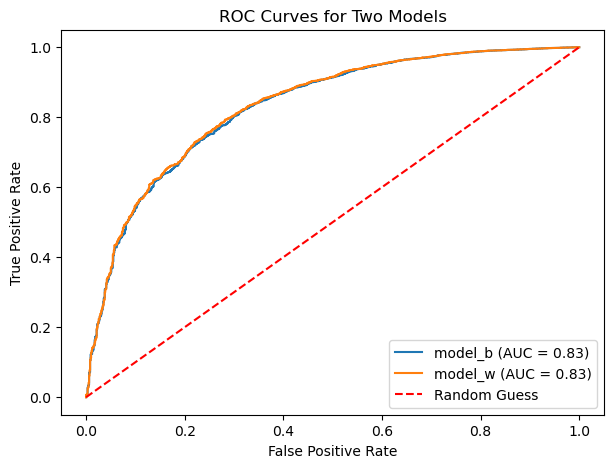

Auc for our sample data are 0.83 for balanced model and 0.83 for weighted model


In [5]:
# 6. Fast Modeling 
# 6.1 fast modeling and evaluation (for better insight)
display(train.columns)
display(sorted_corrwith(train_sc, y)) # to verify scale does not change indices and corr is the same
# dd1 ={0:0.93, 1:0.07}; model_dd1 = LogisticRegression(class_weight=dd1) 
# based on minor to major class ratio but # trial & error ==> 0.87 maximize F-score! why? no idea!
model_clf(model_b, X_train, y_train, X_test, y_test)
model_clf(model_w, X_train, y_train, X_test, y_test)

# 6.2 why F-score instead of ROC, AUC, .....
y_pred_model_b = model_b.fit(X_train,y_train).predict_proba(X_test)[:, 1]
y_pred_model_w = model_w.fit(X_train,y_train).predict_proba(X_test)[:, 1]
# ROC
test_df = pd.DataFrame( {'True': y_test, 'model_b': y_pred_model_b, 'model_w': y_pred_model_w}) # Create a DataFrame
plt.figure(figsize=(7, 5))
 
for model in ['model_b', 'model_w']:
    fpr, tpr, _ = roc_curve(test_df['True'], test_df[model])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{model} (AUC = {roc_auc:.2f})')
# Plot random guess line
plt.plot([0, 1], [0, 1], 'r--', label='Random Guess')
# Set labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Two Models')
plt.legend()
plt.show()
# AUC
auc_b , auc_w = np.round(roc_auc_score(y_test, y_pred_model_b), 3), np.round(roc_auc_score(y_test, y_pred_model_w), 3)
print("Auc for our sample data are {} for balanced model and {} for weighted model".format(auc_b, auc_b))

# 7. Functions II: Feature Engineering

In [6]:
# 7. Functions II: Feature Engineering
# initial values for Feature extraction: 
l_PCA, l_ICA, l_LDA = ['PCA0', 'PCA1', 'PCA2', 'PCA3'], ['ICA0', 'ICA1'], ['lda']
FE_all = l_PCA + l_ICA + l_LDA

PCA_p, ICA_p, LDA_p = ['PCA0_p', 'PCA1_p', 'PCA2_p', 'PCA3_p'], ['ICA0_p', 'ICA1_p'], ['lda_p']
FEp_all = PCA_p+ LDA_p

# 7.1 FE01 PCA
def PCA_n(X_train = X_train_sc, y_train = y_train,  X_test = X_test_sc, y_test = y_test, n=4):
    pca = PCA(n_components = n) 
    X_train_PCA = pca.fit_transform(X_train, y_train)
    X_test_PCA = pca.transform(X_test)
    explained_variance = pca.explained_variance_ratio_; print("explained_variance", explained_variance)
    display(sorted_corrwith(pd.DataFrame(X_train_PCA, index= y_train.index), y_train))
    return X_train_PCA, X_test_PCA

# 7.2 FE02 ICA
def ICA_n(X_train = X_train_sc, y_train = y_train,  X_test = X_test_sc, y_test = y_test, n=2):
    ica = FastICA(n_components = n)
    X_train_ICA = ica.fit_transform(X_train, y_train)
    X_test_ICA = ica.transform(X_test)
    display(sorted_corrwith(pd.DataFrame(X_train_ICA, index= y_train.index), y_train))
    
    return X_train_ICA, X_test_ICA


# 7.3 FE03 LDA
def LDA_n(X_train = X_train_sc, y_train = y_train,  X_test = X_test_sc, y_test = y_test, n=1):
    lda = LinearDiscriminantAnalysis(n_components = n)
    X_train_LDA = lda.fit_transform(X_train, y_train)
    X_test_LDA = lda.transform(X_test)
    display(sorted_corrwith(pd.DataFrame(X_train_LDA, index= y_train.index), y_train))
    
    return X_train_LDA, X_test_LDA


# 7.4 FE04 KPCA
def KPCA_n(X_train = X_train_sc, y_train = y_train,  X_test = X_test_sc, y_test = y_test, n=4):
    kpca = KernelPCA(kernel='rbf', n_components = n, gamma=.07) 
    X_train_KPCA = kpca.fit_transform(X_train, y_train)
    X_test_KPCA = kpca.transform(X_test)
    #explained_variance = kpca.explained_variance_ratio_; print("explained_variance", explained_variance)
    display(sorted_corrwith(pd.DataFrame(X_train_KPCA, index= y_train.index), y_train))
    return X_train_KPCA, X_test_KPCA

# 7.5 FE05 poly
def FE_poly(p_tr = X_train_sc, p_te = X_test_sc, cols = col_countinuos, degree=3):
    poly = PolynomialFeatures(degree=3, include_bias = False)
    X_poly_train = poly.fit_transform(p_tr[cols])
    X_poly_test = poly.transform(p_te[cols])
    # display(sorted_corrwith2(p_tr[cols], y_train))
    display(sorted_corrwith2(X_poly_train, y_train))
    poly_col_name = ['ploy'+str(i) for i in range(X_poly_train.shape[1])]
    poly_col_name = ['ploy'+str(i) for i in range(X_poly_train.shape[1])]
    return pd.DataFrame(X_poly_train, index=X_train_sc.index, columns=poly_col_name)\
           , pd.DataFrame(X_poly_test, index=X_test_sc.index, columns=poly_col_name) 

# 7.6 combining extracted features
def FE_all_FE_all_r(X_train_sc, X_test_sc):
    # FE_all   ==> df + FE  
    # FE_all_r ==> just FE (PCA, LDA, IDA)
    X_train_new, X_test_new  = X_train_sc.copy(), X_test_sc.copy() 
    
    # appending FE_all to original data
    X_train_new[l_PCA], X_test_new[l_PCA] = X_train_PCA, X_test_PCA
    X_train_new[l_ICA], X_test_new[l_ICA] = X_train_ICA, X_test_ICA
    X_train_new[l_LDA], X_test_new[l_LDA] = X_train_LDA, X_test_LDA
    
    # 7.3.3)just FE_all
    X_train_new_r, X_test_new_r = X_train_new [FE_all].copy(), X_test_new [FE_all].copy() 
    
    # corr
    display(sorted_corrwith(X_train_new_r, y_train))
    display(sorted_corrwith(X_train_new, y_train))
    return X_train_new, X_test_new, X_train_new_r, X_test_new_r


# 7.7 combination of ploy (PolynomialFeatures), categorial features, FE of poly (for example PCA for poly) and FE
def poly_FEpoly_binary_FE(X_poly_train, X_poly_test):
    # Xp_FEp_train: poly + cat + FEp + FE 
    # notation:   FEp: features extracted from poly
    Xp_FEp_train, Xp_FEp_test  = X_poly_train.copy(), X_poly_test.copy() 
    # appending binary (or categotial features to poly) (note: poly just include continuos cols)
    for col in set(X_train_sc.columns)-set(col_countinuos):
        Xp_FEp_train[col], Xp_FEp_test[col] = X_train_sc[col], X_test_sc[col]
    # appending FEp to poly
    Xp_FEp_train[PCA_p], Xp_FEp_test[PCA_p] = X_poly_train_PCA, X_poly_test_PCA
    Xp_FEp_train[LDA_p], Xp_FEp_test[LDA_p] = X_poly_train_LDA, X_poly_test_LDA
    # appending FE (of original df)
    Xp_FEp_train[FE_all], Xp_FEp_test[FE_all] = X_train_new[FE_all], X_test_new[FE_all]
    # just FEp_all
    Xp_FEp_train_r, Xp_FEp_test_r = Xp_FEp_train[FEp_all].copy(), Xp_FEp_test[FEp_all].copy() 
    # corr
    display(sorted_corrwith(Xp_FEp_train_r, y_train))
    display(sorted_corrwith(Xp_FEp_train, y_train))
    return Xp_FEp_train, Xp_FEp_test, Xp_FEp_train_r, Xp_FEp_test_r


# 8. Feature Engineering
LDA is the best: corr = 0.4 &  f1_score = 0.39 with just one feature!

In [7]:
# (care!! time consuming! do not run if you are not sure)
# 8. Feature Engineering (Feature Extraction + Feature selection)
# 8.1 evaluation of Extracted Features
dd ={0:0.87, 1:0.13};  model = LogisticRegression(class_weight=dd)
FE01 = PCA_n(); X_train_PCA, X_test_PCA = FE01
model_clf(model, *XY(*PCA_n()))
###############################################################################################
FE02 = ICA_n(); X_train_ICA, X_test_ICA = FE02
model_clf(model, *XY(*FE02))
###############################################################################################    
FE03 = LDA_n(); X_train_LDA, X_test_LDA = FE03
model_clf(model, *XY(*FE03))
###############################################################################################    
# FE04 KPCA  ==> why random answer!? F.score ==> from 0 to 0.33
n_samp = 3000 # slow run =>sample needed
ind = X_train.sample(n_samp).index
X_train_to_KPCA, y_train_to_KPCA = X_train_sc[X_train_sc.index.isin(ind)], y_train[y_train.index.isin(ind)]
FE04 = KPCA_n(X_train_to_KPCA, y_train_to_KPCA, X_test_sc, y_test); X_train_KPCA, X_test_KPCA = FE04
model_clf(model, X_train_KPCA, y_train_to_KPCA, X_test_KPCA, y_test)
###############################################################################################    
# ehtemalan
FE05 = FE_poly(); X_poly_train, X_poly_test = FE05
model_clf(model, *XY(*FE_poly()))

######################*********************************************************************************##############
# lda for poly (exactly similar to original lda without discreate features)
FE06 = LDA_n(*XY(X_poly_train, X_poly_test))
X_poly_train_LDA, X_poly_test_LDA = FE06 # for future use to append to FE
model_clf(model, *XY(*FE06))
######################*********************************************************************************##############
FE07 = PCA_n(X_poly_train, y_train, X_poly_test, y_test)
X_poly_train_PCA, X_poly_test_PCA = FE07 # for future use only
model_clf(model, *XY(*FE07))
######################*********************************************************************************##############
FE08 = PCA_n(X_poly_train, y_train, X_poly_test, y_test)
X_poly_train_PCA, X_poly_test_PCA = FE08 # for future use only
model_clf(model, *XY(*FE08))
######################*********************************************************************************##############

# FE09 = X_poly_train_all, X_poly_test_all
# model_clf(model, X_poly_train_all, y_train, X_poly_test_all, y_test)
# display(sorted_corrwith(X_poly_train_all, y)) # this LDA is less power tahn original LDA ful for not having discreate cols

######################*********************************************************************************##############
# modeling with adding original (old) lda with high correlated new features
# selected_FE = sorted_corrwith(X_poly_train_all, y).columns[:12]; display(selected_FE)
# X_train_semi = X_poly_train_all[selected_FE].copy(); X_train_semi['LDA_old'] = FE03[0]
# X_test_semi = X_poly_test_all[selected_FE].copy(); X_test_semi['LDA_old'] = FE03[1]
# sorted_corrwith(X_train_semi, y)

# FE10 = X_train_semi, X_test_semi
# model_clf(model, *XY(*FE10))
######################*********************************************************************************##############

# # scaled
# X_test_semi_sc, X_train_semi_sc = scale(X_test_semi, X_train_semi, s='m')
# FE11 = X_train_semi_sc, X_test_semi_sc
# model_clf(model, *XY(*FE11))
######################*********************************************************************************##############

# 8.2 Feature Selection
# features with less than 5% correlation:
# [sourcing_channel, premium, PCA1, ICA0, no_of_premiums_paid, ICA1, PCA0, residence_area_type]
# my previous experience taught me do not remove features just based on low correlation 
# I will not work on feature selection in this part; if we want to choose featuer selection 
# one option is to choose most correlated features for example  [lDA, Count_6.12_months_late, PCA2
# , Count_more_than_12_months_late, Count_3.6_months_late, perc_premium_paid_by_cash_credit, PCA3, age]
# but here we will show different senarios randomly; I will work on feature selection in next drafts;
# but you can refer to my previous notebook if you are interested in feature selection
######################*********************************************************************************##############
# df + FE
X_train_new, X_test_new, X_train_new_r, X_test_new_r = FE_all_FE_all_r(X_train_sc, X_test_sc)
# 4 extracted features have good correlation (lda, ICA1, PCA1, PCA2)    
######################*********************************************************************************##############
# poly + cat + FEp + FE
Xp_cat_FEp_FE_train, Xp_cat_FEp_FE_test, FEp_train, FEp_test = poly_FEpoly_binary_FE(X_poly_train, X_poly_test) 
# 2 extracted features from poly have good correlation (lda_p, PCA0_p) 
######################*********************************************************************************##############
# scale
X_train_new_sc, X_test_new_sc = scale(X_train_new, X_test_new)
X_train_new_r_sc, X_test_new_r_sc = scale(X_train_new_r, X_test_new_r)
######################*********************************************************************************##############
FEp_train_sc, FEp_test_sc = scale(FEp_train, FEp_test)
Xp_cat_FEp_FE_train_sc, Xp_cat_FEp_FE_test_sc = scale(Xp_cat_FEp_FE_train, Xp_cat_FEp_FE_test)
######################*********************************************************************************##############



explained_variance [0.32838027 0.18751929 0.1618857  0.1030928 ]


,1,2,3,0
0,-0.20262,0.170161,-0.013275,-0.00064


explained_variance [0.32838027 0.18751929 0.1618857  0.1030928 ]


,1,2,3,0
0,-0.20262,0.170161,-0.013275,-0.00064


array([[ 2002,  2019],
       [ 8120, 51741]], dtype=int64)

array([[  485,   492],
       [ 2082, 12912]], dtype=int64)

train accuracy is 84.13 		 test accuracy is 83.88
train f1_score is 28.31 		 test f1_score is 27.37


,0,1
0,-0.20262,0.000557


array([[ 1158,  2863],
       [ 5425, 54436]], dtype=int64)

array([[  270,   707],
       [ 1364, 13630]], dtype=int64)

train accuracy is 87.03 		 test accuracy is 87.03
train f1_score is 21.84 		 test f1_score is 20.68


,0
0,-0.405972


array([[ 1801,  2220],
       [ 3386, 56475]], dtype=int64)

array([[  444,   533],
       [  897, 14097]], dtype=int64)

train accuracy is 91.22 		 test accuracy is 91.05
train f1_score is 39.12 		 test f1_score is 38.31


,1,2,0,3
0,-0.209357,0.16059,0.017216,-0.005744


array([[  93,  122],
       [ 292, 2493]], dtype=int64)

array([[  408,   569],
       [ 1577, 13417]], dtype=int64)

train accuracy is 86.2 		 test accuracy is 86.56
train f1_score is 31.0 		 test f1_score is 27.55


,5,0,20,23,24,8,21,9,32,6,...,53,14,45,16,47,44,4,50,19,54
0,-0.246439,-0.242083,-0.241124,-0.202845,-0.197332,-0.190384,-0.184898,-0.173599,-0.168428,-0.166915,...,0.051661,0.050977,0.041387,0.040506,0.03412,0.029524,0.026181,0.018408,0.007202,-0.000333


,5,0,20,23,24,8,21,9,32,6,...,53,14,45,16,47,44,4,50,19,54
0,-0.246439,-0.242083,-0.241124,-0.202845,-0.197332,-0.190384,-0.184898,-0.173599,-0.168428,-0.166915,...,0.051661,0.050977,0.041387,0.040506,0.03412,0.029524,0.026181,0.018408,0.007202,-0.000333


G:\Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


array([[ 1960,  2061],
       [ 8096, 51765]], dtype=int64)

array([[  485,   492],
       [ 2088, 12906]], dtype=int64)

train accuracy is 84.1 		 test accuracy is 83.85
train f1_score is 27.85 		 test f1_score is 27.32


,0
0,0.272469


array([[ 1729,  2292],
       [ 6475, 53386]], dtype=int64)

array([[  423,   554],
       [ 1643, 13351]], dtype=int64)

train accuracy is 86.28 		 test accuracy is 86.24
train f1_score is 28.29 		 test f1_score is 27.8
explained_variance [0.31724764 0.23986169 0.18772139 0.09803016]


,0,1,2,3
0,0.235755,-0.055177,-0.035409,-0.018528


array([[ 1880,  2141],
       [ 7948, 51913]], dtype=int64)

array([[  445,   532],
       [ 2005, 12989]], dtype=int64)

train accuracy is 84.21 		 test accuracy is 84.11
train f1_score is 27.15 		 test f1_score is 25.97
explained_variance [0.31724764 0.23986169 0.18772139 0.09803016]


,0,1,2,3
0,0.235755,-0.055177,-0.035409,-0.018528


array([[ 1880,  2141],
       [ 7948, 51913]], dtype=int64)

array([[  445,   532],
       [ 2005, 12989]], dtype=int64)

train accuracy is 84.21 		 test accuracy is 84.11
train f1_score is 27.15 		 test f1_score is 25.97


,lda,ICA0,PCA1,PCA2,PCA3,PCA0,ICA1
0,-0.405972,-0.20262,-0.20262,0.170161,-0.013275,-0.00064,0.000557


,lda,Count_6-12_months_late,Count_3-6_months_late,Count_more_than_12_months_late,perc_premium_paid_by_cash_credit,ICA0,PCA1,PCA2,age,application_underwriting_score,Income,sourcing_channel,no_of_premiums_paid,PCA3,PCA0,ICA1,residence_area_type
0,-0.405972,-0.306039,-0.25325,-0.246014,-0.242083,-0.20262,-0.20262,0.170161,0.096639,0.071804,0.0624,0.04252,0.026181,-0.013275,-0.00064,0.000557,0.000184


,lda_p,PCA0_p,PCA1_p,PCA2_p,PCA3_p
0,0.272469,0.235755,-0.055177,-0.035409,-0.018528


,lda,Count_6-12_months_late,lda_p,Count_3-6_months_late,ploy5,Count_more_than_12_months_late,ploy0,ploy20,PCA0_p,ploy23,...,ploy44,ploy4,PCA3_p,ploy50,PCA3,ploy19,PCA0,ICA1,ploy54,residence_area_type
0,-0.405972,-0.306039,0.272469,-0.25325,-0.246439,-0.246014,-0.242083,-0.241124,0.235755,-0.202845,...,0.029524,0.026181,-0.018528,0.018408,-0.013275,0.007202,-0.00064,0.000557,-0.000333,0.000184


# 9. Modeling

In [8]:
# 9. Modeling
# 9.1 logistic regression
model_clf(model, X_train_new_sc, y_train, X_test_new_sc, y_test) # scaled(df+FE)
model_clf(model, X_train_new_r_sc, y_train, X_test_new_r_sc, y_test) # just FE (without df)
model_clf(model, X_train_new_r_sc.drop(['lda'],axis=1), y_train, X_test_new_r_sc.drop(['lda']\
                           ,axis=1), y_test) # (FE - lda) ==> to show the importance od lda

# 9.2 scaled data in logistic regression 
print("*"*50+"Scaled data"+"*"*50)
model_clf(model, FEp_train, y_train, FEp_test, y_test)               # FEp (extracted from poly)
model_clf(model, FEp_train_sc, y_train, FEp_test_sc, y_test) # scaled FEp
model_clf(model, Xp_cat_FEp_FE_train, y_train, Xp_cat_FEp_FE_test, y_test) # all
model_clf(model, Xp_cat_FEp_FE_train_sc, y_train, Xp_cat_FEp_FE_test_sc, y_test) # scaled all
# i did not understand why accuracy & f scored decreased with scale: (later: I should find out)
# one scenario is that the important features have bigger values (by chance) before scaling

array([[ 1967,  2054],
       [ 4298, 55563]], dtype=int64)

array([[  470,   507],
       [ 1110, 13884]], dtype=int64)

train accuracy is 90.06 		 test accuracy is 89.88
train f1_score is 38.25 		 test f1_score is 36.76


array([[ 1943,  2078],
       [ 4169, 55692]], dtype=int64)

array([[  458,   519],
       [ 1076, 13918]], dtype=int64)

train accuracy is 90.22 		 test accuracy is 90.01
train f1_score is 38.35 		 test f1_score is 36.48


array([[ 1996,  2025],
       [ 8082, 51779]], dtype=int64)

array([[  479,   498],
       [ 2077, 12917]], dtype=int64)

train accuracy is 84.18 		 test accuracy is 83.88
train f1_score is 28.31 		 test f1_score is 27.12
**************************************************Scaled data**************************************************


array([[ 1825,  2196],
       [ 7118, 52743]], dtype=int64)

array([[  448,   529],
       [ 1838, 13156]], dtype=int64)

train accuracy is 85.42 		 test accuracy is 85.18
train f1_score is 28.15 		 test f1_score is 27.46


array([[ 1826,  2195],
       [ 7189, 52672]], dtype=int64)

array([[  444,   533],
       [ 1842, 13152]], dtype=int64)

train accuracy is 85.31 		 test accuracy is 85.13
train f1_score is 28.01 		 test f1_score is 27.21


G:\Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


array([[ 2045,  1976],
       [ 4357, 55504]], dtype=int64)

array([[  514,   463],
       [ 1144, 13850]], dtype=int64)

train accuracy is 90.09 		 test accuracy is 89.94
train f1_score is 39.24 		 test f1_score is 39.01


G:\Program Files\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


array([[ 2021,  2000],
       [ 4277, 55584]], dtype=int64)

array([[  501,   476],
       [ 1120, 13874]], dtype=int64)

train accuracy is 90.17 		 test accuracy is 90.01
train f1_score is 39.17 		 test f1_score is 38.57


In [9]:
# 9.3 SVM (SVC)
n_samp = 2000 # slow run =>sample needed
ind = X_train.sample(n_samp).index
X_train_to_SVM_all, y_train_to_SVM = Xp_cat_FEp_FE_train[Xp_cat_FEp_FE_train.index.isin(ind)], y_train[Xp_cat_FEp_FE_train.index.isin(ind)]
# go next notebook to continue coding inorder to avoid random chance in comparing kernels and parameters
######################*********************************************************************************##############
# rbf is the best with 0.39 f1-score (not fix due to sampling)
model =SVC(class_weight=dd) # rbf  ==> result 0.4 shows that no more data needed (features are not good enough)
model_clf(model, X_train_to_SVM_all[l_LDA], y_train_to_SVM, Xp_cat_FEp_FE_test[l_LDA], y_test)
######################*********************************************************************************##############
model =SVC(class_weight=dd, C=0.5) # rbf  ==> result 0.4 shows that no more data needed (features are not good enough)
model_clf(model, X_train_to_SVM_all, y_train_to_SVM, Xp_cat_FEp_FE_test, y_test)
######################*********************************************************************************##############
model =SVC(class_weight=dd, kernel='linear', C=2)
model_clf(model, X_train_to_SVM_all[l_ICA], y_train_to_SVM, Xp_cat_FEp_FE_test[l_ICA], y_test)
######################*********************************************************************************##############
model =SVC(class_weight=dd, kernel='poly')
model_clf(model, X_train_to_SVM_all[l_PCA], y_train_to_SVM, Xp_cat_FEp_FE_test[l_PCA], y_test)
######################*********************************************************************************##############
model =SVC(class_weight=dd, kernel='poly', degree=7, C=0.05)
model_clf(model, X_train_to_SVM_all[l_PCA], y_train_to_SVM, Xp_cat_FEp_FE_test[l_PCA], y_test)
######################*********************************************************************************##############
model =SVC(class_weight=dd, kernel='sigmoid')
model_clf(model, X_train_to_SVM_all[FE_all], y_train_to_SVM, Xp_cat_FEp_FE_test[FE_all], y_test)

array([[  61,   63],
       [ 121, 1755]], dtype=int64)

array([[  480,   497],
       [ 1089, 13905]], dtype=int64)

train accuracy is 90.8 		 test accuracy is 90.07
train f1_score is 39.87 		 test f1_score is 37.71


array([[  65,   59],
       [ 124, 1752]], dtype=int64)

array([[  482,   495],
       [ 1218, 13776]], dtype=int64)

train accuracy is 90.85 		 test accuracy is 89.27
train f1_score is 41.53 		 test f1_score is 36.01


array([[   0,  124],
       [   0, 1876]], dtype=int64)

array([[    0,   977],
       [    0, 14994]], dtype=int64)

train accuracy is 93.8 		 test accuracy is 93.88
train f1_score is 0.0 		 test f1_score is 0.0


array([[  54,   70],
       [ 132, 1744]], dtype=int64)

array([[  368,   609],
       [ 1303, 13691]], dtype=int64)

train accuracy is 89.9 		 test accuracy is 88.03
train f1_score is 34.84 		 test f1_score is 27.79


array([[  40,   84],
       [  91, 1785]], dtype=int64)

array([[  270,   707],
       [  846, 14148]], dtype=int64)

train accuracy is 91.25 		 test accuracy is 90.28
train f1_score is 31.37 		 test f1_score is 25.8


array([[  53,   71],
       [ 466, 1410]], dtype=int64)

array([[  496,   481],
       [ 3918, 11076]], dtype=int64)

train accuracy is 73.15 		 test accuracy is 72.46
train f1_score is 16.49 		 test f1_score is 18.4


# 10. Functions III: NN

In [10]:
# 10. Functions III: NN
# 10.1 parameters & inital values
# learning_rate = 0.01 
eps=-0.2
input_dim0 = train.shape[1]-1 
param1_comp = {"loss":focal_loss(), "optimizer":'rmsprop', "metrics":['acc']}
param_XY_fit = {"X_train":X_train_sc, "X_test":X_test_sc, "y_train":y_train, "y_test":y_test\
                ,'no_epochs':50, "batch_ratio":0.2}

param_XY_fit_comp = Merge(param1_comp, param_XY_fit)
#dd = {0: 0.8, 1: 0.2}

# 10.2 functions
def par_hidden(u1=30, u2=10, u3=5, act1 = 'ReLU', act2 = 'ReLU', act3 = 'ReLU',acto = 'sigmoid'):
    param1_hid1 = {"input_dim":input_dim0, "units":u1,  "activation" : act1}
    param1_hid2 = {                        "units":u2,  "activation" : act2}
    param1_hid3 = {                        "units":u3,  "activation" : act3}
    param1_acto = {                                         "activation" : acto}
    param1_hidden = [param1_hid1, param1_hid2, param1_hid3, param1_acto]
    return param1_hidden

def DNN_arc(param1_hidden=par_hidden(), n_hidden = 2, no_epochs=50,  **param_XY_fit_comp):
    # arcitecture & compile
    
    if n_hidden == 3:
        param1_hid1, param1_hid2, param1_hid3, param1_acto = param1_hidden
    elif n_hidden == 2:
        param1_hid1, param1_hid2, param1_acto = *param1_hidden[:2], param1_hidden[-1]
    else:
        print("This program is just for 2 or 3 hidden layers")
        return

    model = Sequential()
    model.add(Dense(**param1_hid1))
    model.add(Dense(**param1_hid2))
    if n_hidden == 3:
        model.add(Dense(**param1_hid3))
    model.add(Dense(1,**param1_acto))
    model.compile(**param1_comp)
    
    # fit and predict
    param_fit = {"epochs":no_epochs, "batch_size":len(X_train_sc), "verbose":2, "class_weight":dd}
    model.fit(X_train_sc, y_train, **param_fit)
    #model.fit(X_train_sc, y_train, epochs=no_epochs, batch_size=len(X_train_sc),  verbose=2)
    predictions_test = model.predict(X_test_sc)
    predictions_train = model.predict(X_train_sc)
    # converting continuos prediction to binaray                 # important
    return predictions_train, predictions_test, y_train, y_test


def DNN_rd_eval(predictions_train, predictions_test, y_train, y_test, eps =-.08):
    def semi_normal(l1, l2=predictions_train):
        return (l1-l2.min())/(l2.max()-l2.min())
    rounded_test = [int(round(x[0]+eps)) for x in semi_normal(predictions_test)]
    rounded_train = [int(round(x[0]+eps)) for x in semi_normal(predictions_train)]
    # evaluation
    display(confusion_matrix(y_train, rounded_train), confusion_matrix(y_test, rounded_test))
    eval_clf(y_train, rounded_train,y_test, rounded_test)

    # helps to change and adjust eps manually
    display(pd.DataFrame(predictions_test).describe())
    semi_normal_pred = semi_normal(predictions_test) 
    pd.DataFrame(semi_normal_pred).describe()

# 11. Deep Neural Network: Loss Function
why F-score is not used as a loss function in deep learning of imbalanced datasets?
Loss function must be differentiable to enable Gradient Descent algorithm to converge; So, F-score which is not differentiable is just an evaluation metric and not a loss function. Therefore, it will be harder to optimize F-score with keras or any other deep learning libraries. we will apply 'binary_crossentropy' and also "Focal loss" which is a modulating term to the cross entropy loss in order to focus learning on hard misclassified examples.

In [11]:
# 11. deep Neural Network

# DNN1
model_DNN1 = DNN_arc()
DNN_rd_eval(*model_DNN1)
######################*********************************************************************************##############
# DNN1: Adjusting eps
DNN_rd_eval(*model_DNN1, eps = -.3)
######################*********************************************************************************##############
# DNN2: 3 hidden layers
model_DNN2 = DNN_arc(n_hidden=3)
DNN_rd_eval(*model_DNN2)
######################*********************************************************************************##############
model_DNN3 = DNN_arc(par_hidden(u1=40, u2=20, act2 = 'tanh'))
DNN_rd_eval(*model_DNN3)
######################*********************************************************************************##############
# DNN3:   loss='binary_crossentropy'      optimizer:'Adam'

param1_comp = {"loss":'binary_crossentropy', "optimizer":'Adam', "metrics":['acc']} # 29%
param_XY_fit_comp = Merge(param1_comp, param_XY_fit)
model_DNN3 = DNN_arc(param3_hidden=par_hidden())
DNN_rd_eval(*model_DNN3)
######################*********************************************************************************##############
# DNN3: u1: 30 ==>40   loss='binary_crossentropy'      optimizer:'Adam'

param1_comp = {"loss":'binary_crossentropy', "optimizer":'Adam', "metrics":['acc']} # 33%
param_XY_fit_comp = Merge(param1_comp, param_XY_fit)
model_DNN3 = DNN_arc(param3_hidden=par_hidden(u1=40),n_hidden=3,no_epochs=200)
DNN_rd_eval(*model_DNN3)
######################*********************************************************************************##############
# DNN3: u1: 30 ==>40   loss='binary_crossentropy'      optimizer:'Adam'

param1_comp = {"loss":'binary_crossentropy', "optimizer":'Adam', "metrics":['acc']} # 34%
param_XY_fit_comp = Merge(param1_comp, param_XY_fit)
model_DNN3 = DNN_arc(param3_hidden=par_hidden(u1=40),n_hidden=3,no_epochs=200)
DNN_rd_eval(*model_DNN3)
######################*********************************************************************************##############
# DNN3: u1: 30 ==>40   loss='binary_crossentropy'      optimizer:'Adam'

param1_comp = {"loss":'binary_crossentropy', "optimizer":'Adam', "metrics":['acc']} # 34.5%
param_XY_fit_comp = Merge(param1_comp, param_XY_fit)
model_DNN3 = DNN_arc(param3_hidden=par_hidden(u1=50, u2=20, u3=10),n_hidden=3,no_epochs=200)
DNN_rd_eval(*model_DNN3)
######################*********************************************************************************##############
# DNN3: u1: 30 ==>40   loss='binary_crossentropy'      optimizer:'Adam'

param1_comp = {"loss":'binary_crossentropy', "optimizer":'Adam', "metrics":['acc']} # 37.8%
param_XY_fit_comp = Merge(param1_comp, param_XY_fit)
model_DNN3 = DNN_arc(param3_hidden=par_hidden(u1=15, u2=50, u3=70),n_hidden=3,no_epochs=200)
DNN_rd_eval(*model_DNN3)

Epoch 1/50
1/1 - 2s - loss: 0.0731 - acc: 0.9175 - 2s/epoch - 2s/step
Epoch 2/50
1/1 - 0s - loss: 0.0720 - acc: 0.9276 - 18ms/epoch - 18ms/step
Epoch 3/50
1/1 - 0s - loss: 0.0712 - acc: 0.9326 - 16ms/epoch - 16ms/step
Epoch 4/50
1/1 - 0s - loss: 0.0705 - acc: 0.9350 - 16ms/epoch - 16ms/step
Epoch 5/50
1/1 - 0s - loss: 0.0699 - acc: 0.9362 - 15ms/epoch - 15ms/step
Epoch 6/50
1/1 - 0s - loss: 0.0694 - acc: 0.9368 - 14ms/epoch - 14ms/step
Epoch 7/50
1/1 - 0s - loss: 0.0689 - acc: 0.9370 - 15ms/epoch - 15ms/step
Epoch 8/50
1/1 - 0s - loss: 0.0684 - acc: 0.9370 - 15ms/epoch - 15ms/step
Epoch 9/50
1/1 - 0s - loss: 0.0679 - acc: 0.9370 - 14ms/epoch - 14ms/step
Epoch 10/50
1/1 - 0s - loss: 0.0675 - acc: 0.9371 - 13ms/epoch - 13ms/step
Epoch 11/50
1/1 - 0s - loss: 0.0671 - acc: 0.9371 - 13ms/epoch - 13ms/step
Epoch 12/50
1/1 - 0s - loss: 0.0667 - acc: 0.9371 - 14ms/epoch - 14ms/step
Epoch 13/50
1/1 - 0s - loss: 0.0663 - acc: 0.9371 - 12ms/epoch - 12ms/step
Epoch 14/50
1/1 - 0s - loss: 0.0660 - 

array([[ 1308,  2713],
       [17533, 42328]], dtype=int64)

array([[  324,   653],
       [ 4414, 10580]], dtype=int64)

train accuracy is 68.31 		 test accuracy is 68.27
train f1_score is 11.44 		 test f1_score is 11.34


,0
count,15971.000000
mean,0.854765
std,0.052392
min,0.651550
25%,0.822087
50%,0.862612
75%,0.896209
max,0.964288


array([[ 3210,   811],
       [47852, 12009]], dtype=int64)

array([[  781,   196],
       [12121,  2873]], dtype=int64)

train accuracy is 23.82 		 test accuracy is 22.88
train f1_score is 11.66 		 test f1_score is 11.25


,0
count,15971.000000
mean,0.854765
std,0.052392
min,0.651550
25%,0.822087
50%,0.862612
75%,0.896209
max,0.964288


Epoch 1/50
1/1 - 0s - loss: 0.0842 - acc: 0.0629 - 496ms/epoch - 496ms/step
Epoch 2/50
1/1 - 0s - loss: 0.0829 - acc: 0.0642 - 16ms/epoch - 16ms/step
Epoch 3/50
1/1 - 0s - loss: 0.0822 - acc: 0.0819 - 17ms/epoch - 17ms/step
Epoch 4/50
1/1 - 0s - loss: 0.0817 - acc: 0.2052 - 15ms/epoch - 15ms/step
Epoch 5/50
1/1 - 0s - loss: 0.0813 - acc: 0.4207 - 16ms/epoch - 16ms/step
Epoch 6/50
1/1 - 0s - loss: 0.0811 - acc: 0.5524 - 16ms/epoch - 16ms/step
Epoch 7/50
1/1 - 0s - loss: 0.0809 - acc: 0.6428 - 15ms/epoch - 15ms/step
Epoch 8/50
1/1 - 0s - loss: 0.0808 - acc: 0.7032 - 14ms/epoch - 14ms/step
Epoch 9/50
1/1 - 0s - loss: 0.0807 - acc: 0.7468 - 14ms/epoch - 14ms/step
Epoch 10/50
1/1 - 0s - loss: 0.0806 - acc: 0.7807 - 14ms/epoch - 14ms/step
Epoch 11/50
1/1 - 0s - loss: 0.0805 - acc: 0.8084 - 15ms/epoch - 15ms/step
Epoch 12/50
1/1 - 0s - loss: 0.0804 - acc: 0.8310 - 15ms/epoch - 15ms/step
Epoch 13/50
1/1 - 0s - loss: 0.0803 - acc: 0.8497 - 15ms/epoch - 15ms/step
Epoch 14/50
1/1 - 0s - loss: 0.0

array([[   57,  3964],
       [   39, 59822]], dtype=int64)

array([[   16,   961],
       [   12, 14982]], dtype=int64)

train accuracy is 93.73 		 test accuracy is 93.91
train f1_score is 2.77 		 test f1_score is 3.18


,0
count,15971.000000
mean,0.528282
std,0.004005
min,0.475080
25%,0.525477
50%,0.527924
75%,0.531622
max,0.537911


Epoch 1/50
1/1 - 0s - loss: 0.0937 - acc: 0.0631 - 450ms/epoch - 450ms/step
Epoch 2/50
1/1 - 0s - loss: 0.0897 - acc: 0.0655 - 18ms/epoch - 18ms/step
Epoch 3/50
1/1 - 0s - loss: 0.0870 - acc: 0.0792 - 18ms/epoch - 18ms/step
Epoch 4/50
1/1 - 0s - loss: 0.0848 - acc: 0.1348 - 18ms/epoch - 18ms/step
Epoch 5/50
1/1 - 0s - loss: 0.0830 - acc: 0.2677 - 17ms/epoch - 17ms/step
Epoch 6/50
1/1 - 0s - loss: 0.0814 - acc: 0.4508 - 18ms/epoch - 18ms/step
Epoch 7/50
1/1 - 0s - loss: 0.0799 - acc: 0.6100 - 18ms/epoch - 18ms/step
Epoch 8/50
1/1 - 0s - loss: 0.0786 - acc: 0.7439 - 17ms/epoch - 17ms/step
Epoch 9/50
1/1 - 0s - loss: 0.0774 - acc: 0.8490 - 20ms/epoch - 20ms/step
Epoch 10/50
1/1 - 0s - loss: 0.0763 - acc: 0.9006 - 16ms/epoch - 16ms/step
Epoch 11/50
1/1 - 0s - loss: 0.0752 - acc: 0.9230 - 16ms/epoch - 16ms/step
Epoch 12/50
1/1 - 0s - loss: 0.0742 - acc: 0.9335 - 16ms/epoch - 16ms/step
Epoch 13/50
1/1 - 0s - loss: 0.0733 - acc: 0.9360 - 16ms/epoch - 16ms/step
Epoch 14/50
1/1 - 0s - loss: 0.0

array([[  829,  3192],
       [ 7271, 52590]], dtype=int64)

array([[  207,   770],
       [ 1865, 13129]], dtype=int64)

train accuracy is 83.62 		 test accuracy is 83.5
train f1_score is 13.68 		 test f1_score is 13.58


,0
count,15971.000000
mean,0.853886
std,0.034452
min,0.686795
25%,0.831597
50%,0.862098
75%,0.880217
max,0.918710


Epoch 1/50
1/1 - 1s - loss: 0.1143 - acc: 0.9333 - 937ms/epoch - 937ms/step
Epoch 2/50
1/1 - 0s - loss: 0.1137 - acc: 0.9343 - 19ms/epoch - 19ms/step
Epoch 3/50
1/1 - 0s - loss: 0.1131 - acc: 0.9350 - 13ms/epoch - 13ms/step
Epoch 4/50
1/1 - 0s - loss: 0.1125 - acc: 0.9354 - 15ms/epoch - 15ms/step
Epoch 5/50
1/1 - 0s - loss: 0.1119 - acc: 0.9360 - 14ms/epoch - 14ms/step
Epoch 6/50
1/1 - 0s - loss: 0.1114 - acc: 0.9365 - 14ms/epoch - 14ms/step
Epoch 7/50
1/1 - 0s - loss: 0.1109 - acc: 0.9366 - 13ms/epoch - 13ms/step
Epoch 8/50
1/1 - 0s - loss: 0.1104 - acc: 0.9369 - 14ms/epoch - 14ms/step
Epoch 9/50
1/1 - 0s - loss: 0.1100 - acc: 0.9370 - 14ms/epoch - 14ms/step
Epoch 10/50
1/1 - 0s - loss: 0.1095 - acc: 0.9371 - 12ms/epoch - 12ms/step
Epoch 11/50
1/1 - 0s - loss: 0.1091 - acc: 0.9371 - 13ms/epoch - 13ms/step
Epoch 12/50
1/1 - 0s - loss: 0.1087 - acc: 0.9371 - 13ms/epoch - 13ms/step
Epoch 13/50
1/1 - 0s - loss: 0.1083 - acc: 0.9371 - 12ms/epoch - 12ms/step
Epoch 14/50
1/1 - 0s - loss: 0.1

array([[ 2711,  1310],
       [15345, 44516]], dtype=int64)

array([[  661,   316],
       [ 3925, 11069]], dtype=int64)

train accuracy is 73.93 		 test accuracy is 73.45
train f1_score is 24.56 		 test f1_score is 23.76


,0
count,15971.000000
mean,0.706093
std,0.088807
min,0.346808
25%,0.650932
50%,0.722605
75%,0.773197
max,0.876627


Epoch 1/200
1/1 - 1s - loss: 0.1228 - acc: 0.5131 - 546ms/epoch - 546ms/step
Epoch 2/200
1/1 - 0s - loss: 0.1222 - acc: 0.6093 - 17ms/epoch - 17ms/step
Epoch 3/200
1/1 - 0s - loss: 0.1217 - acc: 0.6989 - 17ms/epoch - 17ms/step
Epoch 4/200
1/1 - 0s - loss: 0.1213 - acc: 0.7725 - 16ms/epoch - 16ms/step
Epoch 5/200
1/1 - 0s - loss: 0.1209 - acc: 0.8235 - 14ms/epoch - 14ms/step
Epoch 6/200
1/1 - 0s - loss: 0.1206 - acc: 0.8585 - 14ms/epoch - 14ms/step
Epoch 7/200
1/1 - 0s - loss: 0.1203 - acc: 0.8817 - 15ms/epoch - 15ms/step
Epoch 8/200
1/1 - 0s - loss: 0.1200 - acc: 0.8969 - 14ms/epoch - 14ms/step
Epoch 9/200
1/1 - 0s - loss: 0.1197 - acc: 0.9078 - 13ms/epoch - 13ms/step
Epoch 10/200
1/1 - 0s - loss: 0.1194 - acc: 0.9154 - 13ms/epoch - 13ms/step
Epoch 11/200
1/1 - 0s - loss: 0.1191 - acc: 0.9214 - 13ms/epoch - 13ms/step
Epoch 12/200
1/1 - 0s - loss: 0.1188 - acc: 0.9254 - 14ms/epoch - 14ms/step
Epoch 13/200
1/1 - 0s - loss: 0.1186 - acc: 0.9289 - 14ms/epoch - 14ms/step
Epoch 14/200
1/1 - 

Epoch 109/200
1/1 - 0s - loss: 0.0857 - acc: 0.9004 - 14ms/epoch - 14ms/step
Epoch 110/200
1/1 - 0s - loss: 0.0855 - acc: 0.9000 - 14ms/epoch - 14ms/step
Epoch 111/200
1/1 - 0s - loss: 0.0853 - acc: 0.8995 - 15ms/epoch - 15ms/step
Epoch 112/200
1/1 - 0s - loss: 0.0851 - acc: 0.8993 - 15ms/epoch - 15ms/step
Epoch 113/200
1/1 - 0s - loss: 0.0849 - acc: 0.8989 - 16ms/epoch - 16ms/step
Epoch 114/200
1/1 - 0s - loss: 0.0847 - acc: 0.8983 - 14ms/epoch - 14ms/step
Epoch 115/200
1/1 - 0s - loss: 0.0845 - acc: 0.8979 - 13ms/epoch - 13ms/step
Epoch 116/200
1/1 - 0s - loss: 0.0843 - acc: 0.8976 - 45ms/epoch - 45ms/step
Epoch 117/200
1/1 - 0s - loss: 0.0841 - acc: 0.8975 - 15ms/epoch - 15ms/step
Epoch 118/200
1/1 - 0s - loss: 0.0840 - acc: 0.8972 - 16ms/epoch - 16ms/step
Epoch 119/200
1/1 - 0s - loss: 0.0838 - acc: 0.8970 - 16ms/epoch - 16ms/step
Epoch 120/200
1/1 - 0s - loss: 0.0837 - acc: 0.8968 - 14ms/epoch - 14ms/step
Epoch 121/200
1/1 - 0s - loss: 0.0835 - acc: 0.8965 - 16ms/epoch - 16ms/step

array([[ 2374,  1647],
       [ 7213, 52648]], dtype=int64)

array([[  588,   389],
       [ 1851, 13143]], dtype=int64)

train accuracy is 86.13 		 test accuracy is 85.97
train f1_score is 34.89 		 test f1_score is 34.43


,0
count,15971.000000
mean,0.763799
std,0.202130
min,0.002753
25%,0.684828
50%,0.842064
75%,0.907968
max,0.973632


Epoch 1/200
1/1 - 1s - loss: 0.1197 - acc: 0.9370 - 581ms/epoch - 581ms/step
Epoch 2/200
1/1 - 0s - loss: 0.1194 - acc: 0.9371 - 21ms/epoch - 21ms/step
Epoch 3/200
1/1 - 0s - loss: 0.1192 - acc: 0.9371 - 21ms/epoch - 21ms/step
Epoch 4/200
1/1 - 0s - loss: 0.1189 - acc: 0.9371 - 19ms/epoch - 19ms/step
Epoch 5/200
1/1 - 0s - loss: 0.1187 - acc: 0.9371 - 16ms/epoch - 16ms/step
Epoch 6/200
1/1 - 0s - loss: 0.1184 - acc: 0.9371 - 16ms/epoch - 16ms/step
Epoch 7/200
1/1 - 0s - loss: 0.1182 - acc: 0.9371 - 16ms/epoch - 16ms/step
Epoch 8/200
1/1 - 0s - loss: 0.1179 - acc: 0.9371 - 15ms/epoch - 15ms/step
Epoch 9/200
1/1 - 0s - loss: 0.1177 - acc: 0.9371 - 16ms/epoch - 16ms/step
Epoch 10/200
1/1 - 0s - loss: 0.1174 - acc: 0.9371 - 16ms/epoch - 16ms/step
Epoch 11/200
1/1 - 0s - loss: 0.1171 - acc: 0.9371 - 15ms/epoch - 15ms/step
Epoch 12/200
1/1 - 0s - loss: 0.1169 - acc: 0.9371 - 15ms/epoch - 15ms/step
Epoch 13/200
1/1 - 0s - loss: 0.1166 - acc: 0.9371 - 16ms/epoch - 16ms/step
Epoch 14/200
1/1 - 

Epoch 109/200
1/1 - 0s - loss: 0.0875 - acc: 0.8902 - 24ms/epoch - 24ms/step
Epoch 110/200
1/1 - 0s - loss: 0.0874 - acc: 0.8881 - 24ms/epoch - 24ms/step
Epoch 111/200
1/1 - 0s - loss: 0.0872 - acc: 0.8867 - 23ms/epoch - 23ms/step
Epoch 112/200
1/1 - 0s - loss: 0.0871 - acc: 0.8852 - 25ms/epoch - 25ms/step
Epoch 113/200
1/1 - 0s - loss: 0.0870 - acc: 0.8837 - 21ms/epoch - 21ms/step
Epoch 114/200
1/1 - 0s - loss: 0.0868 - acc: 0.8825 - 21ms/epoch - 21ms/step
Epoch 115/200
1/1 - 0s - loss: 0.0867 - acc: 0.8815 - 22ms/epoch - 22ms/step
Epoch 116/200
1/1 - 0s - loss: 0.0866 - acc: 0.8801 - 21ms/epoch - 21ms/step
Epoch 117/200
1/1 - 0s - loss: 0.0864 - acc: 0.8789 - 19ms/epoch - 19ms/step
Epoch 118/200
1/1 - 0s - loss: 0.0863 - acc: 0.8782 - 22ms/epoch - 22ms/step
Epoch 119/200
1/1 - 0s - loss: 0.0862 - acc: 0.8773 - 20ms/epoch - 20ms/step
Epoch 120/200
1/1 - 0s - loss: 0.0861 - acc: 0.8764 - 21ms/epoch - 21ms/step
Epoch 121/200
1/1 - 0s - loss: 0.0859 - acc: 0.8759 - 22ms/epoch - 22ms/step

array([[ 2631,  1390],
       [ 9547, 50314]], dtype=int64)

array([[  641,   336],
       [ 2487, 12507]], dtype=int64)

train accuracy is 82.88 		 test accuracy is 82.32
train f1_score is 32.48 		 test f1_score is 31.23


,0
count,15971.000000
mean,0.766685
std,0.205696
min,0.110505
25%,0.674923
50%,0.855200
75%,0.918771
max,0.976034


Epoch 1/200
1/1 - 1s - loss: 0.1256 - acc: 0.0629 - 635ms/epoch - 635ms/step
Epoch 2/200
1/1 - 0s - loss: 0.1253 - acc: 0.0631 - 18ms/epoch - 18ms/step
Epoch 3/200
1/1 - 0s - loss: 0.1250 - acc: 0.0662 - 19ms/epoch - 19ms/step
Epoch 4/200
1/1 - 0s - loss: 0.1247 - acc: 0.0746 - 19ms/epoch - 19ms/step
Epoch 5/200
1/1 - 0s - loss: 0.1244 - acc: 0.0848 - 17ms/epoch - 17ms/step
Epoch 6/200
1/1 - 0s - loss: 0.1241 - acc: 0.0984 - 18ms/epoch - 18ms/step
Epoch 7/200
1/1 - 0s - loss: 0.1238 - acc: 0.1188 - 18ms/epoch - 18ms/step
Epoch 8/200
1/1 - 0s - loss: 0.1235 - acc: 0.1422 - 21ms/epoch - 21ms/step
Epoch 9/200
1/1 - 0s - loss: 0.1233 - acc: 0.1637 - 19ms/epoch - 19ms/step
Epoch 10/200
1/1 - 0s - loss: 0.1230 - acc: 0.1870 - 19ms/epoch - 19ms/step
Epoch 11/200
1/1 - 0s - loss: 0.1228 - acc: 0.2317 - 19ms/epoch - 19ms/step
Epoch 12/200
1/1 - 0s - loss: 0.1226 - acc: 0.3001 - 17ms/epoch - 17ms/step
Epoch 13/200
1/1 - 0s - loss: 0.1224 - acc: 0.4000 - 18ms/epoch - 18ms/step
Epoch 14/200
1/1 - 

Epoch 109/200
1/1 - 0s - loss: 0.0882 - acc: 0.9205 - 19ms/epoch - 19ms/step
Epoch 110/200
1/1 - 0s - loss: 0.0879 - acc: 0.9191 - 22ms/epoch - 22ms/step
Epoch 111/200
1/1 - 0s - loss: 0.0875 - acc: 0.9174 - 21ms/epoch - 21ms/step
Epoch 112/200
1/1 - 0s - loss: 0.0872 - acc: 0.9160 - 20ms/epoch - 20ms/step
Epoch 113/200
1/1 - 0s - loss: 0.0869 - acc: 0.9145 - 20ms/epoch - 20ms/step
Epoch 114/200
1/1 - 0s - loss: 0.0866 - acc: 0.9133 - 21ms/epoch - 21ms/step
Epoch 115/200
1/1 - 0s - loss: 0.0863 - acc: 0.9122 - 20ms/epoch - 20ms/step
Epoch 116/200
1/1 - 0s - loss: 0.0860 - acc: 0.9105 - 21ms/epoch - 21ms/step
Epoch 117/200
1/1 - 0s - loss: 0.0857 - acc: 0.9089 - 20ms/epoch - 20ms/step
Epoch 118/200
1/1 - 0s - loss: 0.0855 - acc: 0.9074 - 21ms/epoch - 21ms/step
Epoch 119/200
1/1 - 0s - loss: 0.0852 - acc: 0.9061 - 22ms/epoch - 22ms/step
Epoch 120/200
1/1 - 0s - loss: 0.0850 - acc: 0.9050 - 20ms/epoch - 20ms/step
Epoch 121/200
1/1 - 0s - loss: 0.0847 - acc: 0.9033 - 21ms/epoch - 21ms/step

array([[ 2450,  1571],
       [ 7926, 51935]], dtype=int64)

array([[  600,   377],
       [ 2023, 12971]], dtype=int64)

train accuracy is 85.13 		 test accuracy is 84.97
train f1_score is 34.03 		 test f1_score is 33.33


,0
count,15971.000000
mean,0.765475
std,0.208374
min,0.033526
25%,0.685042
50%,0.849958
75%,0.913981
max,0.973225


Epoch 1/200
1/1 - 1s - loss: 0.1233 - acc: 0.0630 - 590ms/epoch - 590ms/step
Epoch 2/200
1/1 - 0s - loss: 0.1231 - acc: 0.2695 - 17ms/epoch - 17ms/step
Epoch 3/200
1/1 - 0s - loss: 0.1228 - acc: 0.3406 - 16ms/epoch - 16ms/step
Epoch 4/200
1/1 - 0s - loss: 0.1226 - acc: 0.4154 - 16ms/epoch - 16ms/step
Epoch 5/200
1/1 - 0s - loss: 0.1225 - acc: 0.4945 - 17ms/epoch - 17ms/step
Epoch 6/200
1/1 - 0s - loss: 0.1223 - acc: 0.5868 - 16ms/epoch - 16ms/step
Epoch 7/200
1/1 - 0s - loss: 0.1222 - acc: 0.6945 - 16ms/epoch - 16ms/step
Epoch 8/200
1/1 - 0s - loss: 0.1221 - acc: 0.7780 - 16ms/epoch - 16ms/step
Epoch 9/200
1/1 - 0s - loss: 0.1220 - acc: 0.8171 - 17ms/epoch - 17ms/step
Epoch 10/200
1/1 - 0s - loss: 0.1220 - acc: 0.8333 - 16ms/epoch - 16ms/step
Epoch 11/200
1/1 - 0s - loss: 0.1219 - acc: 0.8456 - 16ms/epoch - 16ms/step
Epoch 12/200
1/1 - 0s - loss: 0.1218 - acc: 0.8574 - 17ms/epoch - 17ms/step
Epoch 13/200
1/1 - 0s - loss: 0.1218 - acc: 0.8662 - 18ms/epoch - 18ms/step
Epoch 14/200
1/1 - 

Epoch 109/200
1/1 - 0s - loss: 0.1121 - acc: 0.8651 - 23ms/epoch - 23ms/step
Epoch 110/200
1/1 - 0s - loss: 0.1121 - acc: 0.8658 - 23ms/epoch - 23ms/step
Epoch 111/200
1/1 - 0s - loss: 0.1120 - acc: 0.8661 - 21ms/epoch - 21ms/step
Epoch 112/200
1/1 - 0s - loss: 0.1120 - acc: 0.8664 - 22ms/epoch - 22ms/step
Epoch 113/200
1/1 - 0s - loss: 0.1119 - acc: 0.8666 - 28ms/epoch - 28ms/step
Epoch 114/200
1/1 - 0s - loss: 0.1119 - acc: 0.8669 - 20ms/epoch - 20ms/step
Epoch 115/200
1/1 - 0s - loss: 0.1118 - acc: 0.8671 - 19ms/epoch - 19ms/step
Epoch 116/200
1/1 - 0s - loss: 0.1118 - acc: 0.8673 - 21ms/epoch - 21ms/step
Epoch 117/200
1/1 - 0s - loss: 0.1117 - acc: 0.8676 - 21ms/epoch - 21ms/step
Epoch 118/200
1/1 - 0s - loss: 0.1117 - acc: 0.8678 - 18ms/epoch - 18ms/step
Epoch 119/200
1/1 - 0s - loss: 0.1116 - acc: 0.8681 - 21ms/epoch - 21ms/step
Epoch 120/200
1/1 - 0s - loss: 0.1116 - acc: 0.8686 - 19ms/epoch - 19ms/step
Epoch 121/200
1/1 - 0s - loss: 0.1115 - acc: 0.8689 - 18ms/epoch - 18ms/step

array([[ 1286,  2735],
       [ 1711, 58150]], dtype=int64)

array([[  315,   662],
       [  447, 14547]], dtype=int64)

train accuracy is 93.04 		 test accuracy is 93.06
train f1_score is 36.65 		 test f1_score is 36.23


,0
count,15971.000000
mean,0.521774
std,0.085387
min,0.010908
25%,0.551050
50%,0.551050
75%,0.551050
max,0.551050


# 12. Try Again
# 12.1 Why We Should Try Repeatedly Again and Again
Data science problems are not straightforward tasks to begin from a start point and finish at the endpoint! If you do not reach desired results you may need to go back and work on previous sections
late_z_pl could be selected as a good newly extracted feature! However, it is the sum of preprocessed data while preprocessing of sum of raw data has even better correlation and you can try it. All of following approaches are just adding and multiplying these 3 features. you can even try different powers and division. Note that, the proposed outlier handling does not work well to increase the performance of the model. you may comment the outlier handling to compare the results then try to improve it. Repeat the same idea about NA handling and you may reach better results by changing NA handling. You may suggest different strategy for each feature. Work on other tasks like target encoding, feature extraction and so on to reach the final model. We will have simple verification in primitive preprocessing as follows:
 1) make target encoding True for 3FE (3 Feature Extraction)
 2) removing outlier handling ==> better result: change handling strategy
 3) robust or standard scaling does not improve results
 4) more training data improve

The mentioned simple changes are as effective as all feature extracted sections in the previous sections that emphasize on the importance of data preprocessing! you can try other adjustments or try to extract features again as described in previous sections to get better results or you can even try other extracting methods:


In [12]:
# 12.2 Ideas for Try Again
late_plus = pd.DataFrame(train[late_03] + train[late_06] + train[late_12])
late_mult = pd.DataFrame(train[late_03]*train[late_06] *train[late_12])
latem0306, latem0312, latem0612 = pd.DataFrame(train[late_03]*train[late_06]),pd.DataFrame(train[late_03]*train[late_12])\
                                ,pd.DataFrame(train[late_06]*train[late_12])
late_z_pl = pd.DataFrame(0.2*train[late_03] + 0.5*train[late_06] + 0.3*train[late_12]) # special plus (Zarib Plus)
latemmadd = latem0306 + latem0312 + latem0612
late_z_pm = pd.DataFrame(0.4 * latem0306 + 0.3 * latem0312 + 0.4 * latem0612)
late_z0_p = pd.DataFrame(0.3*train0[late_03] + 0.7*train0[late_06] + 0.6*train0[late_12]) 
late_z0p0 = pd.DataFrame(.4*train0[late_03] + 1.5*train0[late_06] + 1.1*train0[late_12]); late_z0p0.loc[late_z0p0[0]>5,:]=5
list_late = [late_plus, late_z_pl, late_z0_p, late_z0p0, late_mult,latem0306,latem0312, latem0612,latemmadd,late_z_pm]
print(list(map(lambda x: rnd(x.corrwith(y)[0],4) , list_late)))
 


[-0.3603, -0.3768, -0.3676, -0.3833, -0.1512, -0.2304, -0.1958, -0.2063, -0.2625, -0.2635]


In [13]:
# 12.3 example og how to try again
train, test = train0.copy(), test0.copy()
# 12.3.1 manual enhance 
manual_enhance_3FE(train,change_type_to_obj_for_target_encoding = True); # 1) make target encoding True ==> better results
manual_enhance_3FE(test,change_type_to_obj_for_target_encoding = True) 
# a) let remain 
# b) convert to obj ==> target encode change values in the next step
##############################################################################################
# 12.3.2 target encoding of categorial(type = object) cols
D = target_encoding(train); target_encoding_test(test, D) # D is important for test
##############################################################################################

# 12.3.3 calculation (for NA & outliers imputations): 
# NA and outliers are not handled in this step to avoid their effects on the each other 

# 12.3.3.1 calculate NA impute value based on test set 
# The calculated results will be applied on both train and test as explained in the introduction sections
NA_values = NA_impute_calculate(test) # I will impute train based on test, later or drop!
NA_cols=['application_underwriting_score',late_03,late_06,late_12]
d_NA = dict(zip(NA_cols,NA_values))


# 12.3.3.2 calculate bands for continuos cols based on test 
# The calculated results will be applied on both train and test
col_countinuos = couninuos_cols(train) 
#bands = all_bands(test)
bands = all_bands(train)
# display(bands, all_bands(train))
#################################################################################################
# 12.3.4  handling (for NA & outliers imputations)
# 12.3.4.1 outlier handling
#outlier_handling(test); outlier_handling(train); # 2) reomving outlier handling ==> better result: change handling strategy
# better result without this step ==> later: reconsider outlier_handling strategy col by col   
# 12.3.4.2 NA handling (make this part of code systematic later)
NA_percentage(train0); NA_percentage(test0) 
NA_handling(train); NA_handling(test) 
# later: check imputed rows to improve strategy or even drop in train
###############################################################################################
# 12.3.5 scale & split
# 12.3.5.1 sclae
test_sc, train_sc = scale(test, train.drop(tar, axis=1), s='m') # 3) roubust or standard scaling does not imporve results
# my innovative strategy: scale train based on test 
# we do not have unseen data in this project and we have distribution of test features.
# 12.3.5.2 X & y
df0_test = test_sc.copy(); df_test = df0_test.copy()
df0 = train_sc.copy(); df = df0.copy()
X = df.copy(); y = train[tar]

# 12.3.5.3 split train set      # should be done after preprocessing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0) #4) more training data improve
X_train_sc, X_test_sc, y_train_sc, y_test_sc = X_train.copy(), X_test.copy()\
                                              , y_train.copy(), y_test.copy() 
idx_train, idx_test = X_train.index, X_test.index
  
# 12.3.6 fast modeling for better insight
display(train.columns)
display(sorted_corrwith(train_sc, y)) # to verify scale does not change indices and corr is the same

# fast modeling
dd1 ={0:0.93, 1:0.07}; # based on minor to major class ratio
model_dd1 = LogisticRegression(class_weight=dd1) 
dd ={0:0.87, 1:0.13};   # trial & error ==> this maximize F-score! why? no idea!
model = LogisticRegression(class_weight=dd)
model_clf(model, X_train, y_train, X_test, y_test)


# 12.3.7 new feature extraction
late_plus = pd.DataFrame(train[late_03] + train[late_06] + train[late_12])
late_mult = pd.DataFrame(train[late_03]*train[late_06] *train[late_12])
latem0306, latem0312, latem0612 = pd.DataFrame(train[late_03]*train[late_06]),pd.DataFrame(train[late_03]*train[late_12])\
                                ,pd.DataFrame(train[late_06]*train[late_12])
late_z_pl = pd.DataFrame(0.2*train[late_03] + 0.5*train[late_06] + 0.3*train[late_12]) # special plus (Zarib Plus)
latemmadd = latem0306 + latem0312 + latem0612
late_z_pm = pd.DataFrame(0.4 * latem0306 + 0.3 * latem0312 + 0.4 * latem0612)
late_z0_p = pd.DataFrame(0.3*train0[late_03] + 0.7*train0[late_06] + 0.6*train0[late_12]) 
late_z0p0 = pd.DataFrame(.4*train0[late_03] + 1.5*train0[late_06] + 1.1*train0[late_12]); late_z0p0.loc[late_z0p0[0]>5,:]=5
list_late = [late_plus, late_z_pl, late_z0_p, late_z0p0, late_mult,latem0306,latem0312, latem0612,latemmadd,late_z_pm]
print(list(map(lambda x: rnd(x.corrwith(y)[0],4) , list_late)))
 
# 12.3.8 report
# The imorovment in results are minor; still better than all previous efforts. So, we can guess where needs more work.


great job! test encoded like train
u need to check if there is any new    obj not seen on train set

perc_premium_paid_by_cash_credit outliers: 0        
lower outliers: 0 ( <LB:-0.72 with min:0.0)        
upper outliers: 0 ( >UB:1.29 with max:1.0)
age outliers: 44        
lower outliers: 0 ( <LB:9.52 with min:21.01)        
upper outliers: 44 ( >UB:93.52 with max:103.02)
Income outliers: 3428        
lower outliers: 0 ( <LB:-108110.0 with min:24030)        
upper outliers: 3428 ( >UB:468210.0 with max:90262600)
application_underwriting_score outliers: 3381        
lower outliers: 3381 ( <LB:97.72 with min:91.9)        
upper outliers: 0 ( >UB:100.64 with max:99.89)
no_of_premiums_paid outliers: 1426        
lower outliers: 0 ( <LB:-3.5 with min:2)        
upper outliers: 1426 ( >UB:24.5 with max:60)
NA percentage of {str(df)}equals to %3.75
NA percentage of {str(df)}equals to %3.88


Index(['perc_premium_paid_by_cash_credit', 'age', 'Income',
       'Count_3-6_months_late', 'Count_6-12_months_late',
       'Count_more_than_12_months_late', 'application_underwriting_score',
       'no_of_premiums_paid', 'sourcing_channel', 'residence_area_type',
       'target'],
      dtype='object')

,Count_6-12_months_late,Count_3-6_months_late,Count_more_than_12_months_late,perc_premium_paid_by_cash_credit,age,application_underwriting_score,sourcing_channel,no_of_premiums_paid,Income,residence_area_type
0,0.314847,0.248622,0.246506,-0.24098,0.095103,0.067145,0.042086,0.022664,0.016541,0.001667


array([[ 1956,  2065],
       [ 4158, 55703]], dtype=int64)

array([[  478,   499],
       [ 1073, 13921]], dtype=int64)

train accuracy is 90.26 		 test accuracy is 90.16
train f1_score is 38.6 		 test f1_score is 37.82
[0.3788, 0.3753, -0.3676, -0.3833, 0.379, 0.3607, 0.3082, 0.3529, 0.38, 0.3813]


# 13. Conclusion & Prediction 
# 13.1 Conclusion
I tried to cover all materials for binary classification of an imbalanced datasets from scratch. The fact that feature extraction and applying different models do not have significant impact on improving F-score demonstrated the importance of data preprocessing; therefore, reconsidering outlier manipulation and missing values (NA) handling, for example with KNN, are keys to increase the performance of modeling. Some minor changes on scaling, transformation and target encoding are applied. An innovative ML algorithm will be presented on Part II. 

# 13.2 Prediction
Since I do not have access to target label of test set in order to verify my predictions on test set, I omit this step and this project is just limited to evaluation on artificial test set manually separated from training set. However, there is no difference in coding and even data preprocessing is done based on test set which make it easier if you are interested in prediction.

# 14. Appendix: EDA
# 14.1 Introduction to EDA: Late Features
In this section we will focus on 3 columns that contain the word "late" i.e. (late_03, late_06 and late_12): 
The average value of target, y.mean(), is plotted based on these 3 features and the result show that there all 3 features are informative and there are direct relationships between these features and the chance of churn (y=1) but the correlation between these 3 features is less than 0.3.
Surprisingly, you may consider that for some values the average of y equals to 1 that means 100 percent of churn; for example, for any value of col1 greater than 9 (col1 = 10, 11, 12, 13); you can find similiar results for col2 and col3.
That might be seen much more interesting if you remember that we changed 0s and 1s in target and we are able to 100 percent predict minor class in some situations which is very important factor for our final evaluation metric; F-score of minor class.However, if you get deeper it is not trustable rules because we do not have these values for mentioned features on test set! Please check the results, tables and plots of applying "EDA_target_mean_cat_train" function on these features; for example:
1) you can see the correlation of late_06 with y is minus; the plot shows how decrease with late_06
2) The number and percentage of each class for both training and test set is printed in the the format of df
3) The final row shows the percentage of y=1 


correlation with Count_3-6_months_late:  -0.249


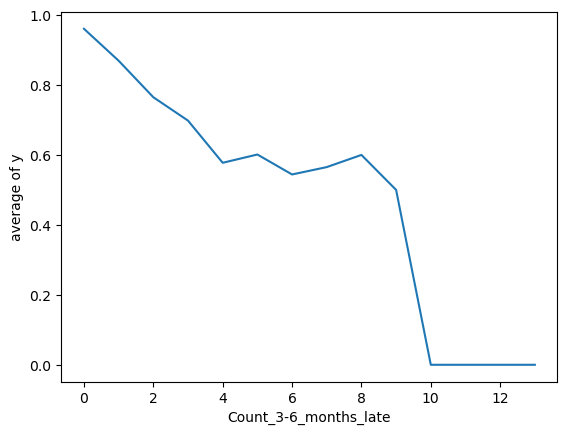

correlation with Count_6-12_months_late:  -0.286


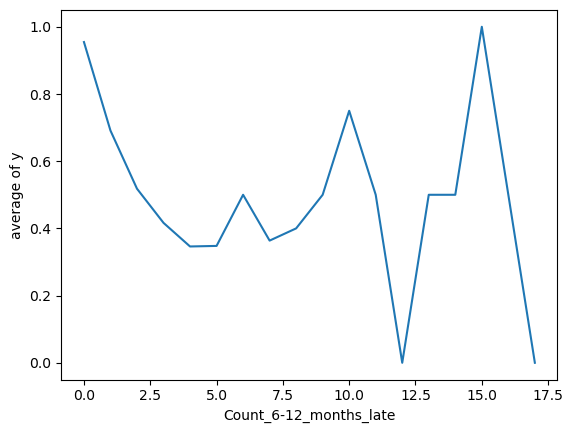

correlation with Count_more_than_12_months_late:  -0.24


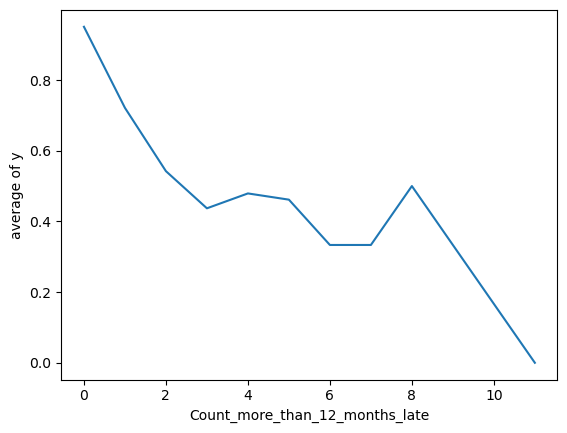

0.2042281530367991 0.2960847486953675 0.2663061054175103


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0
train_3-6,66801.000,8826.000,2519.000,954.000,374.000,168.000,68.000,23.000,15.000,4.000,1.000,1.000,1.000,1.000
%train_3-6,83.655,11.053,3.155,1.195,0.468,0.210,0.085,0.029,0.019,0.005,0.001,0.001,0.001,0.001
test_3-6,28828.000,3734.000,994.000,348.000,160.000,69.000,32.000,15.000,6.000,5.000,1.000,0.000,1.000,0.000
%test_3-6,84.233,10.910,2.904,1.017,0.468,0.202,0.094,0.044,0.018,0.015,0.003,0.000,0.003,0.000
% mean(y)_3-6,96.067,86.936,76.499,69.811,57.754,60.119,54.412,56.522,60.000,50.000,0.000,0.000,0.000,0.000
%y=1_3-6,0.526,0.231,0.118,0.058,0.032,0.013,0.006,0.002,0.001,0.000,0.000,0.000,0.000,0.000


correlation with Count_3-6_months_late:  -0.249


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,17.0,16.0
train_6-12,75831.000,2680.000,693.000,317.000,130.000,46.000,26.000,11.000,5.000,4.000,4.000,2.000,1.000,2.000,2.000,1.000,1.000,NaN
%train_6-12,94.963,3.356,0.868,0.397,0.163,0.058,0.033,0.014,0.006,0.005,0.005,0.003,0.001,0.003,0.003,0.001,0.001,NaN
test_6-12,32521.000,1116.000,312.000,119.000,56.000,28.000,18.000,7.000,5.000,8.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN
%test_6-12,95.024,3.261,0.912,0.348,0.164,0.082,0.053,0.020,0.015,0.023,0.009,0.000,0.000,0.000,0.000,0.000,0.000,NaN
% mean(y)_6-12,95.457,69.104,51.804,41.640,34.615,34.783,50.000,36.364,40.000,50.000,75.000,50.000,0.000,50.000,50.000,100.000,0.000,NaN
%y=1_6-12,0.689,0.166,0.067,0.037,0.017,0.006,0.003,0.001,0.001,0.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,0.0


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


correlation with Count_6-12_months_late:  -0.286


,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,11.0,9.0
train_more,76038.000,2996.000,498.000,151.000,48.000,13.000,6.000,3.000,2.000,1.000,NaN
%train_more,95.222,3.752,0.624,0.189,0.060,0.016,0.008,0.004,0.003,0.001,NaN
test_more,32649.000,1241.000,220.000,52.000,14.000,9.000,7.000,1.000,0.000,0.000,NaN
%test_more,95.398,3.626,0.643,0.152,0.041,0.026,0.020,0.003,0.000,0.000,NaN
% mean(y)_more,95.068,72.130,54.217,43.709,47.917,46.154,33.333,33.333,50.000,0.000,NaN
%y=1_more,0.750,0.167,0.046,0.017,0.005,0.001,0.001,0.000,0.000,NaN,0.0


correlation with Count_more_than_12_months_late:  -0.24


In [14]:
# 14.2 EDA of original data
col0, col1, col2, col3 = 'application_underwriting_score', late_03, late_06, late_12
sum_late_before_imp, sum_late_after_imp = "late_03added",  "late_imputed3_add"
train_save, test_save
train, test= train0.copy(), test0.copy()
EDA_target_mean_cat_train(col1, val_counts = False, plot = True)
EDA_target_mean_cat_train(col2, val_counts = False, plot = True)
EDA_target_mean_cat_train(col3, val_counts = False, plot = True)
print(train[[col1]].corrwith(train[col2])[0],train[[col1]].corrwith(train[col3])[0],train[[col2]].corrwith(train[col3])[0])
EDA_target_mean_cat_train(col1, plot=False)
EDA_target_mean_cat_train(col2, plot=False)
EDA_target_mean_cat_train(col3, plot=False)

correlation with Count_3-6_months_late:  -0.246


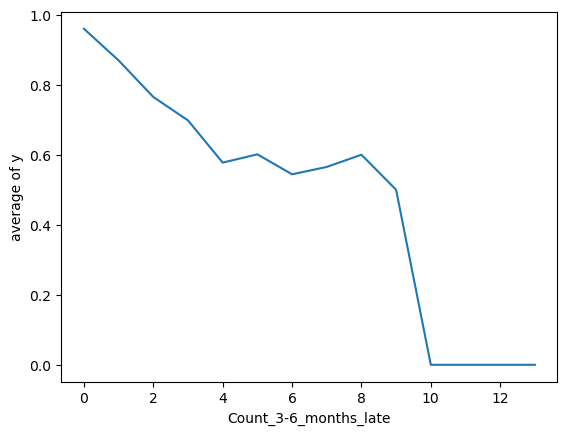

correlation with Count_6-12_months_late:  -0.284


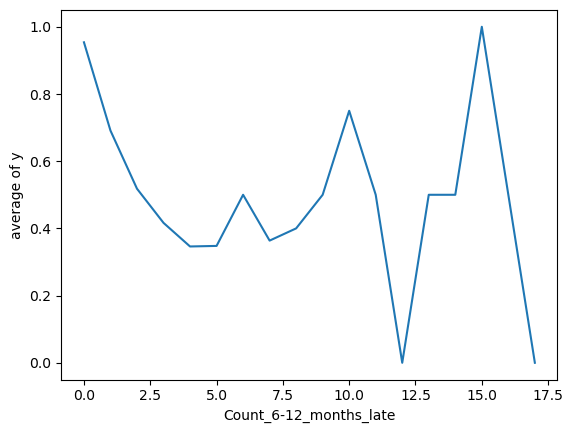

correlation with Count_more_than_12_months_late:  -0.238


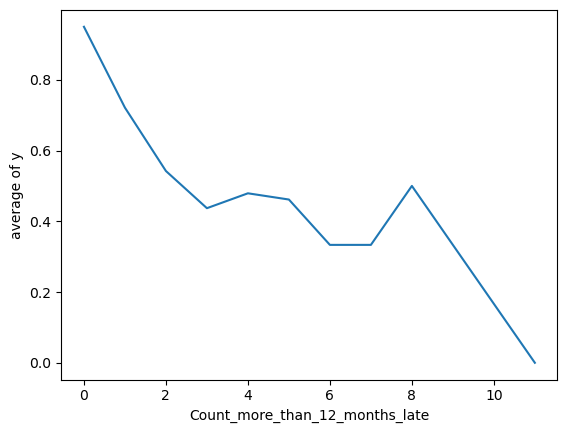

correlation with Count_3-6_months_late:  -0.246
correlation with Count_6-12_months_late:  -0.284
correlation with Count_more_than_12_months_late:  -0.238
0.204286376083221 0.29613884991727557 0.26633677855729393


In [15]:
# 14.3 EDA of data after NA handling
NA_values = NA_impute_calculate(test) # I will impute train based on test. 
NA_cols=[col0, col1, col2, col3]
d_NA = dict(zip(NA_cols,NA_values))
NA_handling(train); NA_handling(test) 
EDA_target_mean_cat_train(col1, val_counts = False, plot = True)
EDA_target_mean_cat_train(col2, val_counts = False, plot = True)
EDA_target_mean_cat_train(col3, val_counts = False, plot = True)
EDA_target_mean_cat_train(col1, val_counts = False)
EDA_target_mean_cat_train(col2, val_counts = False)
EDA_target_mean_cat_train(col3, val_counts = False)
print(train[[col1]].corrwith(train[col2])[0],train[[col1]].corrwith(train[col3])[0],train[[col2]].corrwith(train[col3])[0])

G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0
train_03added,63645.000,9597.000,3201.000,1484.000,802.000,468.000,283.000,162.000,90.000,51.000,18.000,22.000,6.000,9.000,5.000,3.000,3.000,2.000,1.000,1.000
%train_03added,79.703,12.018,4.009,1.858,1.004,0.586,0.354,0.203,0.113,0.064,0.023,0.028,0.008,0.011,0.006,0.004,0.004,0.003,0.001,0.001
test_03added,27463.000,4020.000,1348.000,613.000,310.000,183.000,107.000,74.000,31.000,21.000,26.000,10.000,8.000,6.000,3.000,0.000,0.000,1.000,0.000,0.000
%test_03added,80.245,11.746,3.939,1.791,0.906,0.535,0.313,0.216,0.091,0.061,0.076,0.029,0.023,0.018,0.009,0.000,0.000,0.003,0.000,0.000
% mean(y)_03added,97.076,89.049,78.069,69.542,57.980,51.068,44.170,48.765,45.556,41.176,50.000,40.909,0.000,33.333,0.000,0.000,66.667,0.000,0.000,100.000
%y=1_03added,0.372,0.210,0.140,0.090,0.067,0.046,0.032,0.017,0.010,0.006,0.002,0.003,0.001,0.001,0.001,0.001,0.000,0.000,0.000,0.000


correlation with late_03added:  -0.353
correlation with late_03added:  -0.353


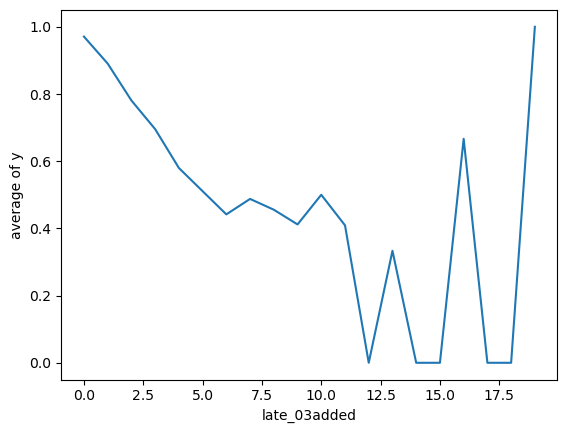

In [16]:
# 14.4 EDA of the extracted feature (sum_late_before_imp: sum of late features before imp)
train[sum_late_before_imp] = train[col1]+ train[col2] + train[col3]
test [sum_late_before_imp] =  test[col1] + test[col2] + test[col3]
EDA_target_mean_cat_train(sum_late_before_imp, plot=False)
EDA_target_mean_cat_train(sum_late_before_imp, val_counts = False, plot = True)

In [17]:
# 14.4 enhacment of data based on EDA
# 14.4.1 inferences of EDA
# EDA should have feasible results on our approach; some possible inferences are commented on the right side of codes.
EDA_target_mean_cat_train(col1, plot=False)                # 5 to 4  & >=6 to 5
EDA_target_mean_cat_train(col2, plot=False)                # 1) >=4 to 4 # sparse!!! 2) binary {0:0, >=1 :1}
EDA_target_mean_cat_train(col3, plot=False)                # 1) >=3 to 3 # sparse!!! 2) binary {0:0, >=1 :1}
EDA_target_mean_cat_train(sum_late_before_imp, plot=False) # 1) >=6 to 6             2) binary {0:0, >=1 :1} 

# 14.4.2 Enhancment in dataset based on above inferences
EDA_manual_enhance_trian_test(train, test, col1, 6,5,  5,4, int_obj=False)
EDA_manual_enhance_trian_test(train, test, col2, 4,4)
EDA_manual_enhance_trian_test(train, test, col3, 3,3)
EDA_manual_enhance_trian_test(train, test, sum_late_before_imp, 6, 6)
######################*********************************************************************************##############
# 14.4.3 EDA after imutations and enhancments
EDA_target_mean_cat_train(col1, plot=False)      # 5 to 4  & >=6 to 5
EDA_target_mean_cat_train(col2, plot=False)      # 1) >=4 to 4 # sparse!!! 2) binary {0:0, >=1 :1}
EDA_target_mean_cat_train(col3, plot=False)      # 1) >=3 to 3 # sparse!!! 2) binary {0:0, >=1 :1}
EDA_target_mean_cat_train(sum_late_before_imp, plot=False) # 1) >=6 to 6  2) binary {0:0, >=1 :1} === or of 3 previous cols

G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0
train_3-6,66898.000,8826.000,2519.000,954.000,374.000,168.000,68.000,23.000,15.000,4.000,1.000,1.000,1.000,1.000
%train_3-6,83.776,11.053,3.155,1.195,0.468,0.210,0.085,0.029,0.019,0.005,0.001,0.001,0.001,0.001
test_3-6,28859.000,3734.000,994.000,348.000,160.000,69.000,32.000,15.000,6.000,5.000,1.000,0.000,1.000,0.000
%test_3-6,84.324,10.910,2.904,1.017,0.468,0.202,0.094,0.044,0.018,0.015,0.003,0.000,0.003,0.000
% mean(y)_3-6,95.983,86.936,76.499,69.811,57.754,60.119,54.412,56.522,60.000,50.000,0.000,0.000,0.000,0.000
%y=1_3-6,0.538,0.231,0.118,0.058,0.032,0.013,0.006,0.002,0.001,0.000,0.000,0.000,0.000,0.000


correlation with Count_3-6_months_late:  -0.246


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,17.0,16.0
train_6-12,75928.000,2680.000,693.000,317.000,130.000,46.000,26.000,11.000,5.000,4.000,4.000,2.000,1.000,2.000,2.000,1.000,1.000,NaN
%train_6-12,95.085,3.356,0.868,0.397,0.163,0.058,0.033,0.014,0.006,0.005,0.005,0.003,0.001,0.003,0.003,0.001,0.001,NaN
test_6-12,32552.000,1116.000,312.000,119.000,56.000,28.000,18.000,7.000,5.000,8.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN
%test_6-12,95.115,3.261,0.912,0.348,0.164,0.082,0.053,0.020,0.015,0.023,0.009,0.000,0.000,0.000,0.000,0.000,0.000,NaN
% mean(y)_6-12,95.384,69.104,51.804,41.640,34.615,34.783,50.000,36.364,40.000,50.000,75.000,50.000,0.000,50.000,50.000,100.000,0.000,NaN
%y=1_6-12,0.701,0.166,0.067,0.037,0.017,0.006,0.003,0.001,0.001,0.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,0.0


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


correlation with Count_6-12_months_late:  -0.284


,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,11.0,9.0
train_more,76135.000,2996.000,498.000,151.000,48.000,13.000,6.000,3.000,2.000,1.000,NaN
%train_more,95.344,3.752,0.624,0.189,0.060,0.016,0.008,0.004,0.003,0.001,NaN
test_more,32680.000,1241.000,220.000,52.000,14.000,9.000,7.000,1.000,0.000,0.000,NaN
%test_more,95.489,3.626,0.643,0.152,0.041,0.026,0.020,0.003,0.000,0.000,NaN
% mean(y)_more,94.996,72.130,54.217,43.709,47.917,46.154,33.333,33.333,50.000,0.000,NaN
%y=1_more,0.762,0.167,0.046,0.017,0.005,0.001,0.001,0.000,0.000,NaN,0.0


correlation with Count_more_than_12_months_late:  -0.238


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0
train_03added,63645.000,9597.000,3201.000,1484.000,802.000,468.000,283.000,162.000,90.000,51.000,18.000,22.000,6.000,9.000,5.000,3.000,3.000,2.000,1.000,1.000
%train_03added,79.703,12.018,4.009,1.858,1.004,0.586,0.354,0.203,0.113,0.064,0.023,0.028,0.008,0.011,0.006,0.004,0.004,0.003,0.001,0.001
test_03added,27463.000,4020.000,1348.000,613.000,310.000,183.000,107.000,74.000,31.000,21.000,26.000,10.000,8.000,6.000,3.000,0.000,0.000,1.000,0.000,0.000
%test_03added,80.245,11.746,3.939,1.791,0.906,0.535,0.313,0.216,0.091,0.061,0.076,0.029,0.023,0.018,0.009,0.000,0.000,0.003,0.000,0.000
% mean(y)_03added,97.076,89.049,78.069,69.542,57.980,51.068,44.170,48.765,45.556,41.176,50.000,40.909,0.000,33.333,0.000,0.000,66.667,0.000,0.000,100.000
%y=1_03added,0.372,0.210,0.140,0.090,0.067,0.046,0.032,0.017,0.010,0.006,0.002,0.003,0.001,0.001,0.001,0.001,0.000,0.000,0.000,0.000


correlation with late_03added:  -0.353


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0,4.0,5.0
train_3-6,66898.000,8826.000,2519.000,954.000,542.000,114.000
%train_3-6,83.776,11.053,3.155,1.195,0.679,0.143
test_3-6,28859.000,3734.000,994.000,348.000,229.000,60.000
%test_3-6,84.324,10.910,2.904,1.017,0.669,0.175
% mean(y)_3-6,95.983,86.936,76.499,69.811,58.487,53.509
%y=1_3-6,0.538,0.231,0.118,0.058,0.045,0.011


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


correlation with Count_3-6_months_late:  -0.248


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0,4.0
train_6-12,75928.000,2680.000,693.000,317.000,235.000
%train_6-12,95.085,3.356,0.868,0.397,0.294
test_6-12,32552.000,1116.000,312.000,119.000,125.000
%test_6-12,95.115,3.261,0.912,0.348,0.365
% mean(y)_6-12,95.384,69.104,51.804,41.640,37.872
%y=1_6-12,0.701,0.166,0.067,0.037,0.029


correlation with Count_6-12_months_late:  -0.307


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0
train_more,76135.000,2996.000,498.000,224.000
%train_more,95.344,3.752,0.624,0.281
test_more,32680.000,1241.000,220.000,83.000
%test_more,95.489,3.626,0.643,0.243
% mean(y)_more,94.996,72.130,54.217,44.196
%y=1_more,0.762,0.167,0.046,0.025


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


correlation with Count_more_than_12_months_late:  -0.245


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0,4.0,5.0,6.0
train_03added,63645.000,9597.000,3201.000,1484.000,802.000,468.000,656.000
%train_03added,79.703,12.018,4.009,1.858,1.004,0.586,0.822
test_03added,27463.000,4020.000,1348.000,613.000,310.000,183.000,287.000
%test_03added,80.245,11.746,3.939,1.791,0.906,0.535,0.839
% mean(y)_03added,97.076,89.049,78.069,69.542,57.980,51.068,44.207
%y=1_03added,0.372,0.210,0.140,0.090,0.067,0.046,0.073


correlation with late_03added:  -0.359


In [18]:
# 14.5 EDA on extracted features
train[sum_late_after_imp] = train[col1]+ train[col2] + train[col3]
test[sum_late_after_imp] =  test[col1] + test[col2] + test[col3]
EDA_target_mean_cat_train(sum_late_after_imp, plot=False)
EDA_manual_enhance_trian_test(train, test, sum_late_after_imp, 5, 5)
EDA_target_mean_cat_train(sum_late_after_imp, plot=False)

G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


,0.0,1.0,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0
train_imputed3,63645.000,9597.000,3201.000,1488.000,912.000,507.000,273.000,123.000,54.000,31.000,14.000,7.000,1.000
%train_imputed3,79.703,12.018,4.009,1.863,1.142,0.635,0.342,0.154,0.068,0.039,0.018,0.009,0.001
test_imputed3,27463.000,4020.000,1348.000,617.000,356.000,201.000,104.000,66.000,27.000,14.000,5.000,1.000,2.000
%test_imputed3,80.245,11.746,3.939,1.803,1.040,0.587,0.304,0.193,0.079,0.041,0.015,0.003,0.006
% mean(y)_imputed3,97.076,89.049,78.069,69.624,58.772,48.915,41.392,47.967,35.185,38.710,14.286,14.286,0.000
%y=1_imputed3,0.372,0.210,0.140,0.090,0.075,0.052,0.032,0.013,0.007,0.004,0.002,0.001,0.000


G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
G:\Program Files\Anaconda\lib\site-packages\pandas\core\reshape\merge.py:1219: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


correlation with late_imputed3_add:  -0.36


,0.0,1.0,2.0,3.0,4.0,5.0
train_imputed3,63645.000,9597.000,3201.000,1488.000,912.000,1010.000
%train_imputed3,79.703,12.018,4.009,1.863,1.142,1.265
test_imputed3,27463.000,4020.000,1348.000,617.000,356.000,420.000
%test_imputed3,80.245,11.746,3.939,1.803,1.040,1.227
% mean(y)_imputed3,97.076,89.049,78.069,69.624,58.772,44.950
%y=1_imputed3,0.372,0.210,0.140,0.090,0.075,0.111


correlation with late_imputed3_add:  -0.359


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
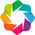

Imported v0.1.731. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


perc_premium_paid_by_cash_credit    0
age                                 0
Income                              0
Count_3-6_months_late               0
Count_6-12_months_late              0
Count_more_than_12_months_late      0
application_underwriting_score      0
no_of_premiums_paid                 0
sourcing_channel                    0
residence_area_type                 0
target                              0
late_03added                        0
late_imputed3_add                   0
dtype: int64

'****************************************************************************************************'

perc_premium_paid_by_cash_credit    0
age                                 0
Income                              0
Count_3-6_months_late               0
Count_6-12_months_late              0
Count_more_than_12_months_late      0
application_underwriting_score      0
no_of_premiums_paid                 0
sourcing_channel                    0
residence_area_type                 0
late_03added                        0
late_imputed3_add                   0
dtype: int64

,sourcing_channel,target
0,A,0.945542
1,B,0.935441
2,C,0.924994
3,D,0.916126
4,E,0.924466


Shape of your Data Set loaded: (79853, 13)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    12 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['id']
Since Number of Rows in data 79853 exceeds maximum, randomly sampling 79853 rows for EDA...

################ Binary_Classification problem #####################
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
perc_premium_paid_by_cash_credit,float64,0.000000,NA,0.000000,1.000000,No issue
age_in_days,int64,0.000000,1,7670.000000,37602.000000,has 44 outliers greater than upper bound (34129.00) or lower than lower bound(3481.00). Cap them or remove them.
Income,int64,0.000000,30,24030.000000,90262600.000000,has 3428 outliers greater than upper bound (468210.00) or lower than lower bound(-108110.00). Cap them or remove them.
Count_3-6_months_late,float64,0.121473,NA,0.000000,13.000000,"97 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 12955 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them."
Count_6-12_months_late,float64,0.121473,NA,0.000000,17.000000,"97 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 3925 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them."
Count_more_than_12_months_late,float64,0.121473,NA,0.000000,11.000000,"97 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 3718 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them."
application_underwriting_score,float64,3.724343,NA,91.900000,99.890000,"2974 missing values. Impute them with mean, median, mode, or a constant value such as 123., has 3381 outliers greater than upper bound (100.64) or lower than lower bound(97.72). Cap them or remove them."
no_of_premiums_paid,int64,0.000000,0,2.000000,60.000000,has 1426 outliers greater than upper bound (24.50) or lower than lower bound(-3.50). Cap them or remove them.
sourcing_channel,object,0.000000,0,nan,nan,1 rare categories: ['E']. Group them into a single category or drop the categories.
residence_area_type,object,0.000000,0,nan,nan,No issue


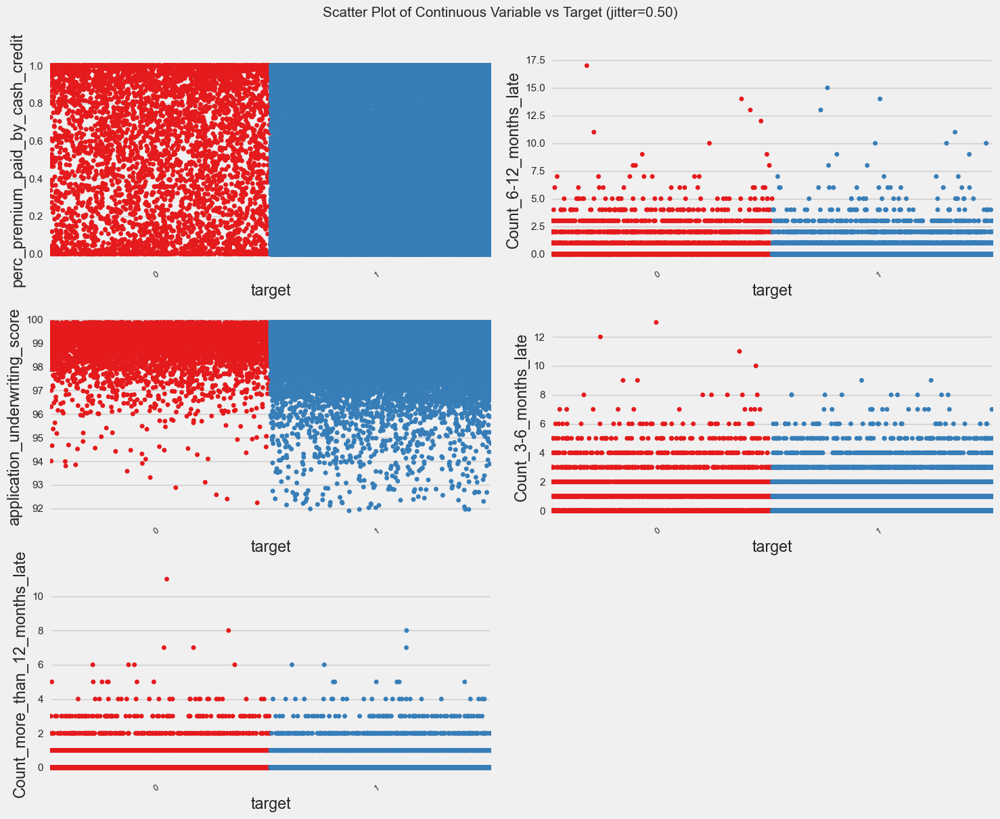

Total Number of Scatter Plots = 15


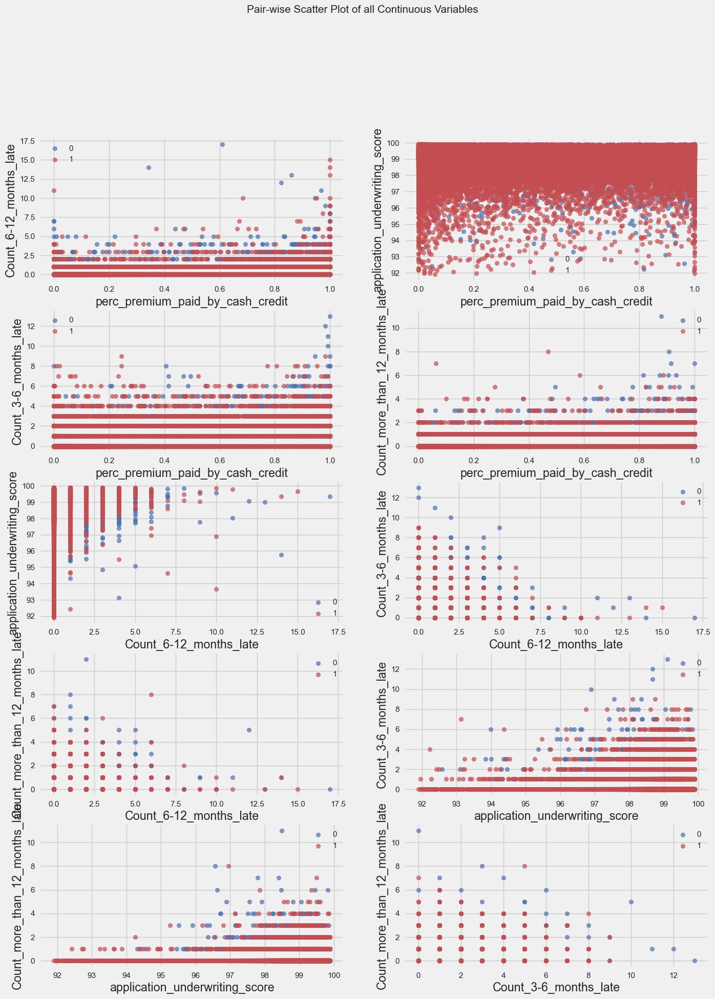

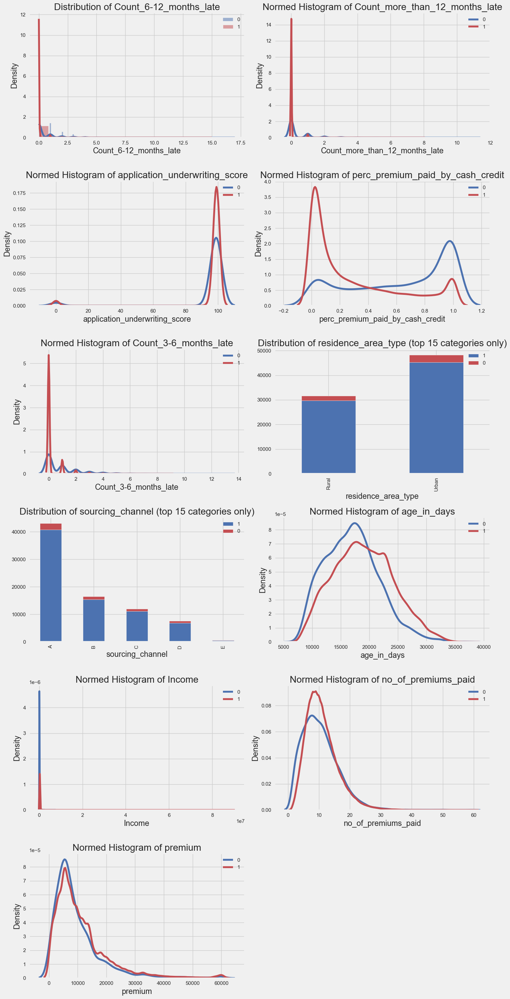

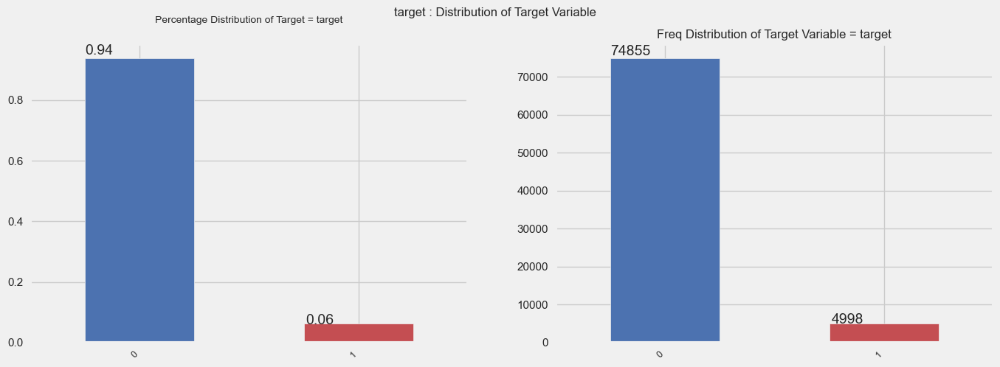

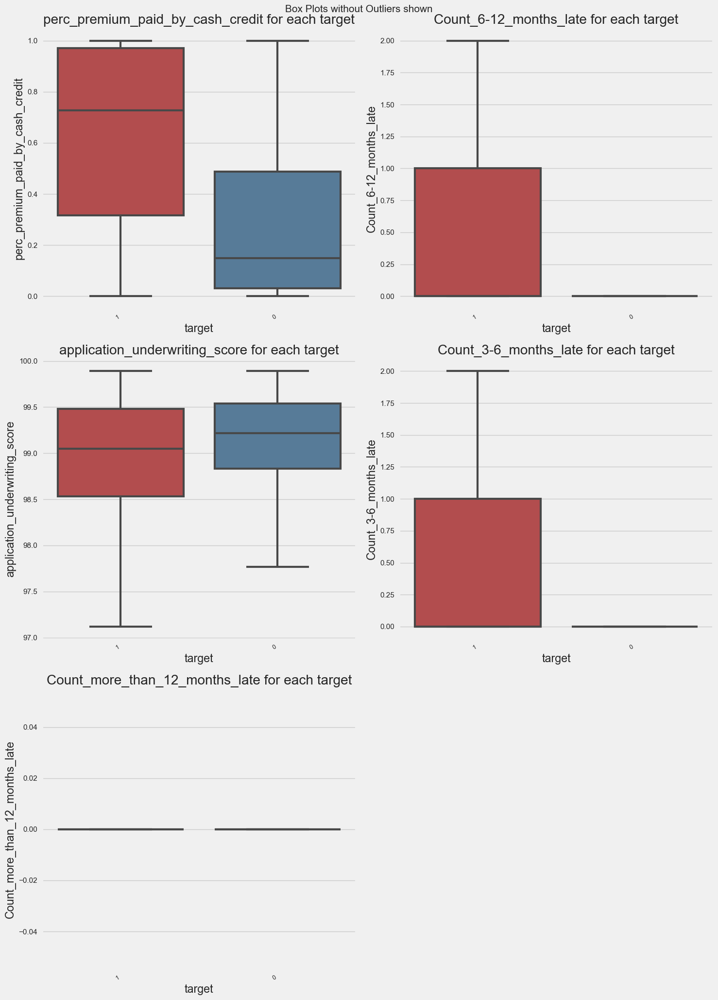

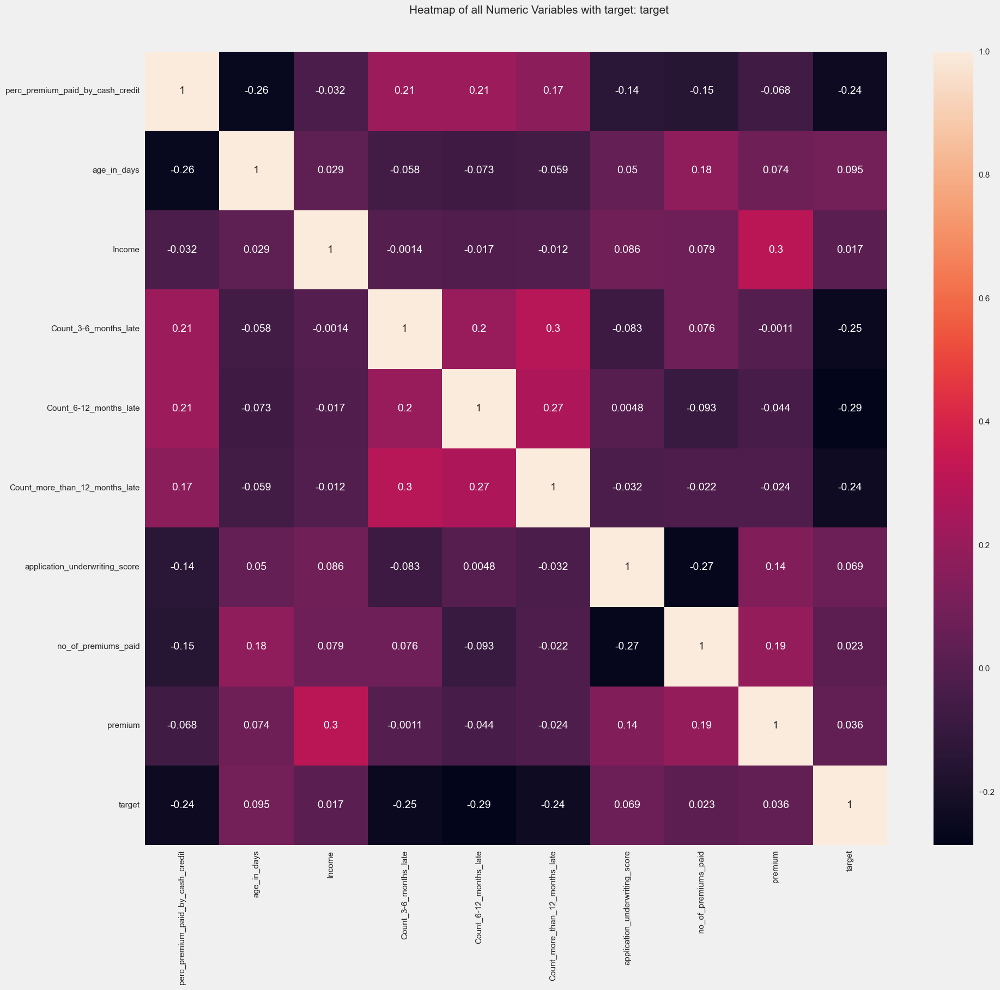

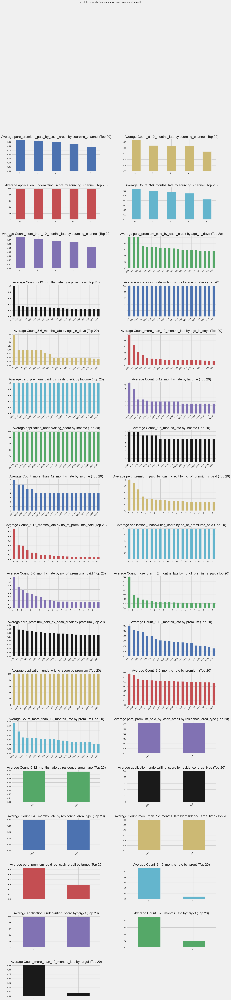

All Plots done
Time to run AutoViz = 27 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,perc_premium_paid_by_cash_credit,age_in_days,Income,Count_3-6_months_late,Count_6-12_months_late,Count_more_than_12_months_late,application_underwriting_score,no_of_premiums_paid,sourcing_channel,residence_area_type,premium,target
71478,0.568,13883,147410,2.0,0.0,0.0,99.58,7,D,Urban,11700,0
75109,0.614,16438,205380,0.0,0.0,0.0,99.53,9,C,Urban,9600,1
65725,0.016,16804,242100,0.0,0.0,0.0,99.03,10,B,Rural,13800,1
78706,0.270,21540,550850,1.0,0.0,0.0,99.42,17,C,Urban,53700,1
74167,0.000,13514,300030,0.0,0.0,0.0,98.71,10,A,Rural,18000,1
...,...,...,...,...,...,...,...,...,...,...,...,...
21243,0.915,25557,72070,0.0,0.0,0.0,98.80,13,B,Rural,7500,1
45891,0.137,12784,2355150,0.0,0.0,0.0,99.85,6,C,Urban,22200,0
42613,0.519,16437,197090,0.0,0.0,0.0,98.85,10,A,Urban,11700,1
43567,0.634,13520,182630,0.0,0.0,0.0,98.88,9,B,Urban,11700,1


In [19]:
# 14.6 EDA based on AutoViz
# There are other libraries that are useful to try
from autoviz.AutoViz_Class import AutoViz_Class
plt.figure(figsize = (15, 6)) # sns.heatmap(train.corr(), annot = True)  
display(train.isnull().sum(), "*"*100, test.isnull().sum())
display(train[['sourcing_channel', tar]].groupby('sourcing_channel', as_index = False).mean())
%matplotlib inline
AV = AutoViz_Class()
AV.AutoViz(filename = f_train, dfte=train, depVar=tar, verbose=1,
           max_rows_analyzed = train.shape[0] ,max_cols_analyzed=train.shape[1])

In [20]:
# 14.7 functions I
# for example, the result could be improved if target encoding used instead of simple encoding
# read again for different version of NA handling & outlier handling
# dd = {0: 0.9, 1: 0.1} # best option by trial & error 
def out2_k(col, upper_bound = 0.95, lower_bound = 0.1, portions = 5, train = train , flag_eq = False): 
    limit = train[col].quantile([lower_bound, upper_bound])
    if flag_eq:
        true_index = (train[col] <= limit.loc[upper_bound]);  false_index = ~true_index
    else: 
        true_index = (train[col] < limit.loc[upper_bound]);  false_index = ~true_index
    no_outlier = train[true_index].copy()
    col_band = col + 'band'
    no_outlier[col_band] = pd.cut(no_outlier[col], portions)
    lvl = no_outlier[[col_band, tar]].groupby(col_band, as_index = False).count()
    return lvl

def out2_k_handle(train, test, col, band):
    portions =  len(band)
    boundries = [band.iloc[i,0].left for i in range(portions)] + [band.iloc[portions-1,0].right]
    train.loc[train[col] <= boundries[0], col] = 0
    test.loc[test[col]   <= boundries[0], col] = 0
    train.loc[train[col] > boundries[-1], col] = portions + 1
    test.loc[test[col]   > boundries[-1], col] = portions + 1
    for i in range(portions):
        train.loc[(train[col] > boundries[i]) & (train[col] <= boundries[i+1]), col] = i+1
        test.loc[(test[col] > boundries[i]) & (test[col] <= boundries[i+1]), col] = i+1
    return train, test

# application_underwriting_score (based on col2)
def handle_k_underwriting(train = train, test = test, col1 = 'application_underwriting_score', col2 = 'sourcing_channel'):
    mask1_train = train[col1].isnull()
    l = sorted(train[col].unique())   # I choose test but it could be train think about it
    for item in l:
        mask2_train = (train[col2] == item)
        train.loc[(mask1_train & (mask2_train)), col1] = train[train[col2] == item][col1].mean()

    mask1_test = test[col1].isnull()
    l = sorted(test[col].unique())   # I choose test but it could be train think about it
    for item in l:
        mask2_test = (test[col2] == item)
        test.loc[mask1_test & (mask2_test), col1] = test[test[col2] == item][col1].mean()  
    return train, test
        
def add3_late_k(df):
    df['lates'] = 0.0
    df.loc[(df[late_03].isnull()),  'lates'] = np.NaN
    a, b, c = df[late_03], df[late_06], df[late_12]
    lates = a + 1.6 * b + 1.2 * c - 0.04* b*c
    #lates = a + b + c
    df.loc[(a.notnull()), 'lates'] = lates
    return df

def NA_k_lates(df, col = 'lates'):
    cond_lates_NA = df[col].isnull()
    c0, c1 = cond_y0 & cond_lates_NA, cond_y1 & cond_lates_NA
    print(df.loc[cond_y0, col].mean(), df.loc[cond_y1, col].mean()) # see the gap!! use it
    df.loc[c0,col] = 2  # it might be odd on test set but it is right choice
    df.loc[c1,col] = 0  # try different values (2 & 0 are mean answers but thses answers are better imputations)
       
def MAP_k_2_col(train = train, test = test, col1 = 'residence_area_type', col2 = 'sourcing_channel'):
    d1, d2 = {'Urban' : 1, 'Rural' : 0}, {'A' : 0, 'B' : 1, 'C' : 2, 'D' : 3, 'E' : 4}
    train[col1], test[col1] = train[col1].map(d1), test[col1].map(d1)
    train[col2], test[col2] = train[col2].map(d2), test[col2].map(d2)
    return train, test

def scale(X_train, X_test, s='m'):
    sc_s, sc_m, sc_r = StandardScaler(), MinMaxScaler(), RobustScaler()
    if s == 'r':
        X_train_sc = pd.DataFrame(sc_r.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
        X_test_sc = pd.DataFrame(sc_r.transform(X_test), columns=X_test.columns, index=X_test.index) 
    elif s=='s':
        X_train_sc = pd.DataFrame(sc_s.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
        X_test_sc = pd.DataFrame(sc_s.transform(X_test), columns=X_test.columns, index=X_test.index)
    else:
        X_train_sc = pd.DataFrame(sc_m.fit_transform(X_train), columns=X_train.columns, index=X_train.index)  
        X_test_sc = pd.DataFrame(sc_m.transform(X_test), columns=X_test.columns, index=X_test.index)

    return X_train_sc, X_test_sc

def sorted_corrwith(X,y):
    idx = np.abs(X.corrwith(y)).sort_values( ascending=False).index
    return pd.DataFrame(X[idx].corrwith(y)).T
# 14.8 Data preprocessing & functions II
# a) Income     
col = 'Income'; band_Income = out2_k(col); display(band_Income)
train, test = out2_k_handle(train, test, 'Income', band_Income)

# b) age     # lower_bound not used
col = 'age'; band_age = out2_k(col, upper_bound = .89, lower_bound = .1, portions = 6, flag_eq = True)
train, test = out2_k_handle(train, test, col, band_age)

# c) late
train, test = add3_late_k(train), add3_late_k(test)
train[tar].corr(train['lates'])
cond_y0, cond_y1 = train[tar] == 0, train[tar] == 1      # needed for NA_k_lates()
NA_k_lates(train); NA_k_lates(test)
train.drop([late_03, late_06, late_12], axis = 1, inplace = True)
test.drop([late_03, late_06, late_12], axis = 1, inplace = True)

# d, e) map 2 cols: col1 = 'residence_area_type', col2 = 'sourcing_channel'
train, test = MAP_k_2_col()     

# f)
col = 'no_of_premiums_paid'
band_no_of_premiums_paid = out2_k(col, upper_bound = 0.95, lower_bound = 0, portions = 4)
train, test = out2_k_handle(train, test, col, band_no_of_premiums_paid)

# g)
# col = 'premium'   # will dropped (not available at target)
# band_premium = out2_k(col)
# train, train = out2_k_handle(train, train, col, band_premium)  # both are the same! not apply test

# h)
col = 'perc_premium_paid_by_cash_credit'  # will dropped
band_perc_premium_paid_by_cash_credit = out2_k(col, upper_bound = 1, lower_bound = 0, portions = 4) # , flag_eq = True
train, test = out2_k_handle(train, test, col, band_perc_premium_paid_by_cash_credit) 
train[col], test[col] = train[col] - 1, test[col] - 1 

# i)
# application_underwriting_score       # will dropped              # error if sooner!!! many null remains!! no idea
col1, col2 = 'application_underwriting_score', 'sourcing_channel' 
train, test = handle_k_underwriting()

# j) Feature selection & split & scale 
X_train_EDA, X_test_EDA = train.iloc[idx_train,:].drop(tar, axis=1), train.iloc[idx_test,:].drop(tar, axis=1)
X_train_EDA_sc, X_test_EDA_sc = scale(X_train_EDA, X_test_EDA)

# k) repeted fuctions that needed (with minor changes)
# Log Loss is similar to the Accuracy, but it will favor models that distinguish more strongly the classes
def model_clf_k(model = model_w, X_train = X_train_EDA_sc, y_train = y_train, X_test = X_test_EDA_sc, y_test=y_test):
    model.fit(X_train, y_train)
    y_pred_train, y_pred_test = model.predict(X_train), model.predict(X_test)
    print(model,"*"*100)
    display(confusion_matrix(y_train, y_pred_train), confusion_matrix(y_test, y_pred_test))
    acc_log_train, acc_log_test = model.score(X_train, y_train) * 100, model.score(X_test, y_test) * 100          # acc_log
    acc_train, acc_test =  accuracy_score(y_train, y_pred_train) * 100, accuracy_score(y_pred_test,y_test) * 100  # acc
    f1_train, f1_test = f1_score(y_train, y_pred_train, pos_label = 0), f1_score(y_pred_test, y_test, pos_label = 0) # f1
    print("train: acc_log: {0:.3f}\t acc: {1:.3f}\t f1: {2:.3f}".format(acc_log_train, acc_train, f1_train)) 
    print("test: acc_log: {0:.3f}\t acc: {1:.3f}\t f1: {2:.3f}".format(acc_log_test, acc_test, f1_test))
    
# FE03 LDA
def LDA_n_k(X_train = X_train_EDA_sc, y_train = y_train,  X_test = X_test_EDA_sc, y_test = y_test, n=1):
    lda = LinearDiscriminantAnalysis(n_components = n)
    X_train_LDA = lda.fit_transform(X_train, y_train)
    X_test_LDA = lda.transform(X_test)
    display(sorted_corrwith(pd.DataFrame(X_train_LDA, index= y_train.index), y_train))
    return X_train_LDA, X_test_LDA

def sorted_corrwith2_k(X,y):    # to save order of X and y after some calculations
    X = pd.DataFrame(X, index=X_train_EDA_sc.index)                 
    idx = np.abs(X.corrwith(y)).sort_values( ascending=False).index
    return pd.DataFrame(X[idx].corrwith(y)).T

,Incomeband,target
0,"(23603.99, 109232.0]",20493
1,"(109232.0, 194434.0]",26922
2,"(194434.0, 279636.0]",16575
3,"(279636.0, 364838.0]",8587
4,"(364838.0, 450040.0]",3269


2.103089235694303 0.3201544319016808
0.41430499325236236 0.4211943376769595


******************************************** default model ********************************************
LogisticRegression(class_weight={0: 0.87, 1: 0.13}) ****************************************************************************************************


array([[ 1979,  2042],
       [ 4555, 55306]], dtype=int64)

array([[  476,   501],
       [ 1174, 13820]], dtype=int64)

train: acc_log: 89.673	 acc: 89.673	 f1: 0.375
test: acc_log: 89.512	 acc: 89.512	 f1: 0.362


,0
0,-0.403556


LogisticRegression(class_weight={0: 0.87, 1: 0.13}) ****************************************************************************************************


array([[ 1841,  2180],
       [ 3570, 56291]], dtype=int64)

array([[  451,   526],
       [  947, 14047]], dtype=int64)

train: acc_log: 90.999	 acc: 90.999	 f1: 0.390
test: acc_log: 90.777	 acc: 90.777	 f1: 0.380


,lates,late_imputed3_add,late_03added,perc_premium_paid_by_cash_credit,age,application_underwriting_score,Income,sourcing_channel,no_of_premiums_paid,residence_area_type
0,-0.374712,-0.362471,-0.36223,-0.240168,0.09566,0.064882,0.061018,-0.042015,0.026761,0.000184


,0
0,-0.403556


**************************************** portion of train data in SVC model: % 0.313 ****************************************
SVC(class_weight={0: 0.87, 1: 0.13}) ****************************************************************************************************


array([[  8,  10],
       [ 10, 172]], dtype=int64)

array([[ 1494,  2527],
       [ 3571, 56290]], dtype=int64)

train: acc_log: 90.000	 acc: 90.000	 f1: 0.444
test: acc_log: 90.454	 acc: 90.454	 f1: 0.329
SVC(class_weight={0: 0.87, 1: 0.13}) ****************************************************************************************************


array([[  8,  10],
       [ 10, 172]], dtype=int64)

array([[  362,   615],
       [  926, 14068]], dtype=int64)

train: acc_log: 90.000	 acc: 90.000	 f1: 0.444
test: acc_log: 90.351	 acc: 90.351	 f1: 0.320


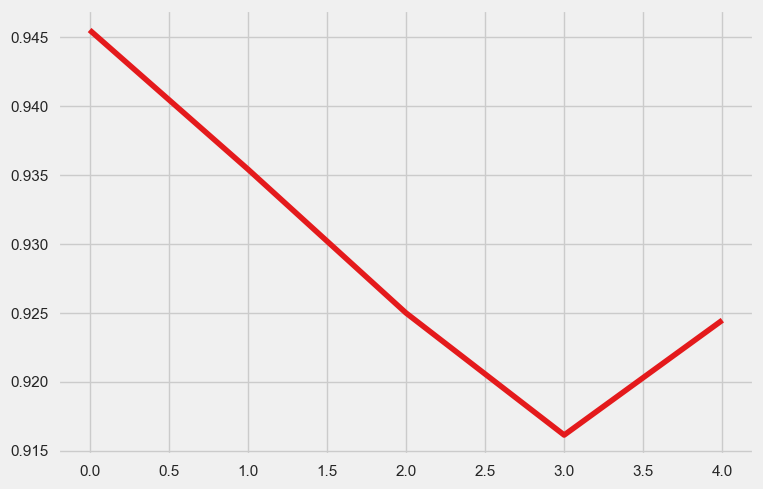

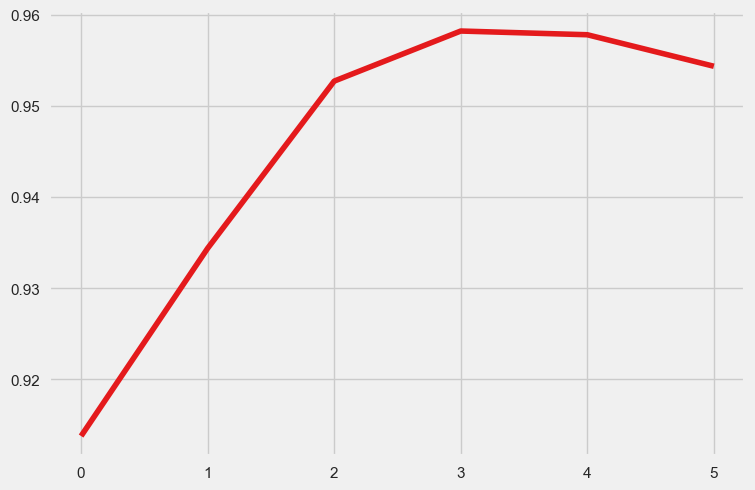

array([[  614,  3407],
       [  491, 59370]], dtype=int64)

array([[  144,   833],
       [  119, 14875]], dtype=int64)

train accuracy is 93.9 		 test accuracy is 94.04
train f1_score is 23.96 		 test f1_score is 23.23


array([[ 1979,  2042],
       [ 4555, 55306]], dtype=int64)

array([[  476,   501],
       [ 1174, 13820]], dtype=int64)

train accuracy is 89.67 		 test accuracy is 89.51
train f1_score is 37.5 		 test f1_score is 36.24


In [21]:
# 14.9 modeling and evaluation dataframe that is preprocessed based on presented EDA (extracted features are not appiled)
# you may try adding extracted features to dataset
# default model (scaled data with logisic regression)
print("*"*44, "default model","*"*44)
model_clf_k()
######################*********************************************************************************##############
# LDA
FE03 = LDA_n_k(); X_train_LDA, X_test_LDA = FE03 
model_clf_k(model_w, *XY(*FE03))
display(sorted_corrwith(X_train_EDA, y_train), sorted_corrwith2_k(X_train_LDA, y_train) )
######################*********************************************************************************##############
# SVC
n_samp = 12000 # apply for last try
n_samp = 200 # slow run => sample needed to compensate
ind = X_train_EDA_sc.sample(n_samp).index
print("*"*40, "portion of train data in SVC model: %", round(100*n_samp/len(X_train_EDA_sc),3), "*"*40)
X_train_to_SVM_k,y_train_to_SVM_k = X_train_EDA_sc[X_train_EDA_sc.index.isin(ind)], y_train[X_train_EDA_sc.index.isin(ind)]
model = SVC(class_weight=dd) # rbf  ==> result 0.4 shows that no more data needed (features are not good enough)
######################*********************************************************************************##############
model_clf_k(model, X_train_to_SVM_k, y_train_to_SVM_k, X_train_EDA_sc, y_train) # because not trained with all train data
######################*********************************************************************************##############
model_clf_k(model, X_train_to_SVM_k, y_train_to_SVM_k, X_test_EDA_sc, y_test)  
######################*********************************************************************************##############

#display((100*sorted_corrwith(X_train_EDA, y_train)).round(4), (100*sorted_corrwith2_k(X_train_LDA, y_train)).round(4))
# folowing tasks are somehow similar to target encoding without exactly relying on target;
# however; still leak the target distribution into features therefore it could be a source of overfiting 
# and might decrease the power of generalization for unseen data and is not recomended for every situation.
# idea about change in imputations:
col = 'sourcing_channel'
average_sourcing = np.array([train.loc[train[col]==i, tar].mean() for i in sorted(train[col].unique())])
plt.plot(average_sourcing); plt.show()
train[col].value_counts()  # is it a good idea to merge 4 & 2? I tried it does not helped me you can try too!
col = 'Income'
average_Income = np.array([train.loc[train[col]==i, tar].mean() for i in sorted(train[col].unique())])
plt.plot(average_Income); plt.show()
train[col].value_counts()  # is it a good idea to merge 4 & 2? I tried it does not helped me you can try too!
#  5==>2.5   4==>2.8 # for example:
# col = 'Income';  # # 3==> 2.6   5==>2.3   4==>2.5
# train.loc[train[col] == 4, 'col'] = 2.8
# train.loc[train[col] == 5, 'col'] = 2.6
######################*********************************************************************************##############
sorted_corrwith(Xp_cat_FEp_FE_train, y_train)
######################*********************************************************************************##############
model_clf(model_b, X_train_EDA_sc, y_train, X_test = X_test_EDA_sc, y_test=y_test)
######################*********************************************************************************##############
model_clf(model_w, X_train_EDA_sc, y_train, X_test = X_test_EDA_sc, y_test=y_test)
######################*********************************************************************************##############
# sel_FE = ['lda', 'lda_p','ploy20', 'PCA0_p','ICA0', 'PCA1', 'PCA2', 'ploy23', 'ploy24', 'ploy21', 'ploy32']
# sorted_corrwith(Xp_cat_FEp_FE_train[sel_FE], y_train)
# X_train_EDA_FE, X_test_EDA_FE = X_train_EDA_sc.copy(), X_test_EDA_sc.copy()
# X_train_EDA_FE[sel_FE], X_test_EDA_FE[sel_FE] = Xp_cat_FEp_FE_train[sel_FE].copy(), Xp_cat_FEp_FE_test[sel_FE].copy()
# X_train_EDA_FE_sc, X_test_EDA_FE_sc = scale(X_train_EDA_FE, X_test_EDA_FE)
# model_clf(model_w, X_train_EDA_FE_sc, y_train, X_test = X_test_EDA_FE_sc, y_test=y_test)
# future work:
# col = 'premium'
# average_premium = np.array([train.loc[train[col]==i, tar].mean() for i in sorted(train[col].unique())])
# plt.plot(average_premium)
# despite low correlation with y, 'premium' is a good feature with direct relationship with y.mean()
# first predict 'premium' on test set (regression), then use it as a new feature for our binary classification problem.

# 15. Future Works & Parallel Modeling of groups (PMG)
# 15.1 Comments for improvement

a) if 'premium' is a good feature ==> 1.predict it on test (regression)  2.binaray classify with that feature. The smaller the "premium", the more chance of being from minor class y=0! you cannot judge a feature just based on correlation specially when one of the variables is not continuous. The situation is even worse if data are imbalanced the correlation! https://www.sciencedirect.com/science/article/abs/pii/S0020025518306224 Uncertainty and imbalanced data can adversely affect correlation results. This paper, "A robust correlation analysis framework for imbalanced and 2 dichotomous data with uncertainty", provides a mathematical analysis of the impact of imbalanced data concerning Pearson Product Moment Correlation (PPMC) analysis. Although the correlation of 'premium' with output is less than 4%, its correlations with other features are very small too (except for income which is approximately 0.3) that makes it potentially a good candidate to model residuals of the presented model.
b) divide ML algorithms to 2 parts: a) those that can handle NA b) those that cannot handle NA (need clean data) SO, the performance of algorithms like boosting that can inherently handle NA might increase since uncertainty will not increase by unnecessary imputations. In addition, in my idea in appendix B you can choose an initial model for grouping from list of ML algorithms that can handle data with missing values and work on data preprocessing of each group and even feature selection tasks independently.
c) change imputing strategy based on the target (target encoding is only optimal for linear regression! try nonlinear transformations)
d) what about dropping NA in training while imputing in test? does really that training helps?! check later! (especially those rows with NA >= 2 in the training set)
e) does really outlier handling help? check it! and also try other methods of outlier detection like percentile
f) is NA handling approach appropriate? check by predicting NA included train set and calculate corresponding f1-score
g) try to convert continuous features into discreate values (because many ML algorithms are not capable to capture simple nonlinear relations between features and the target; for example, most algorithms with sigmoid functions cannot map U-shape relation (or its equivalent discreate format, pulse function) in dataset without future transformation)
h) compare 3FE with and without feature encoding (3FE ==> 3 features including 'months_late')
i) scale data again after FE (feature extraction)

# 15.2 Saving Extracted Data for Another Notebook in Part II
This section is a great innovative idea that will be explained in second part of notebook at my GitHub. we can save a dataframe to csv file with df.to_csv("your_name.csv"); However, I want to use the same train-test split, X_train, X_test, ... in the next notebook and I do not want to save too many files. So, I import pickle library to save 2 lists of dataframes in two files to be able to use at the next notebook. you may also add label to X_train then apply df.to_csv() function.

import pickle
list_sc, list_FE = [X_train_sc, y_train, X_test_sc, y_test], [Xp_cat_FEp_FE_train, y_train, Xp_cat_FEp_FE_test, y_test]
df_sc, df_FE = pd.concat(list_sc), pd.concat(list_FE)

with open("df_sc.pkl", "wb") as file_sc:
    pickle.dump(list_sc, file_sc)
file_sc.close()
with open("df_FE.pkl", "wb") as file_FE:
    pickle.dump(list_FE, file_FE)    
file_FE.close()

# 15.3 Part II: Parallel Modeling of Groups (PMG)
I will divide data into several groups and apply very interesting innovative parallel model. Applying my idea on this data set does not result in great improvement but this new idea is not limited to classification problems and it can make a significant difference on datasets meet conditions that I will explain completely in the next notebook. 
Thanks for reading this notebook! I hope you liked it. 